In [2]:
import pandas as pd
# import the seaborn module
import seaborn as sns
import matplotlib.pyplot as plt
import datetime  as dt
import numpy as np
from matplotlib.ticker import PercentFormatter
import os
import missingno as msno # visualize the distribution of NaN values
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import plotly
# import plotly.graph_objects
# from plotly.subplots import make_subplots

### Reading the Input costello file , we will do the necesaary processing as our first step

In [3]:
#reading the file train one time 
# df= pd.read_csv("costello_ace_2017-2018.csv")

In [13]:
print('\033[1m' + df.columns)


Index(['Date', 'Transaction Time', 'Customer Number',
       'Receipt Number', 'Store #', 'Store Name',
       'Scanned UPC', 'Item Number', 'Item Description',
       'Net Sales Units', 'Net Sales', 'Cost', 'Gross Margin',
       'Gross Margin %', 'Department Code', 'Department Name',
       'Class Code', 'Class Name', 'Fineline Code',
       'Fineline Name', 'Item was Scanned', 'MIP Promo ID',
       'Promo/Discount', 'Dynamic Promo ID', 'Actual Price',
       'Retail Price', 'Actual-Retail', 'Taxable',
       'Tender Type', '$ Off Retail', 'Zip Code', 'Zip Plus-4',
       'Loyalty ID', 'Clerk', 'Item Type', 'Line #',
       'Line Item Transaction Type', 'Pricing Source',
       'Return Code'],
      dtype='object')


In [14]:
print('\033[1m' + 'Shape of the DataFrame' + str(df.shape))

Shape of the DataFrame(17327981, 39)


### Dropping customer Id's and Date that are null

In [18]:
sum(pd.isna(df['Customer Number']))
index = df[pd.isna(df['Customer Number'])].index
df.drop(index , inplace=True)

In [ ]:
#Converting to date time format
df['Date']= pd.to_datetime(df['Date'], dayfirst=True, errors='coerce')

In [ ]:
df.to_csv('./full_data_processed.csv', index=False)

In [21]:
df_sample= pd.read_csv("./full_data_processed.csv")

In [25]:
print('\033[1m' + 'Total Unique Customer Base: ' + str(df_sample['Customer Number'].nunique()))

Total Unique Customer Base: 349346


In [30]:
sum(pd.isna(df_sample['Date']))
index = df_sample[pd.isna(df_sample['Date'])].index
df_sample.drop(index , inplace=True)

In [32]:
print('\033[1m' + 'Min Date: ' + str(min(df_sample['Date'])))
print('\033[1m' + 'Max Date: ' + str(max(df_sample['Date'])))

Min Date: 2017-01-01
Max Date: 2018-12-31


### Conveting Integer Columns to Ints

In [33]:
int_col= ['Store #','Item Number','Net Sales Units','Net Sales Units','Net Sales','Cost',
          'Gross Margin','Item was Scanned','Actual Price','Retail Price','Actual-Retail','Zip Code','Zip Plus-4',
         'Line #']

In [ ]:
df_sample[int_col] = df_sample[int_col].convert_objects(convert_numeric=True)

In [38]:
df_sample.head()

,Date,Transaction Time,Customer Number,Receipt Number,Store #,Store Name,Scanned UPC,Item Number,Item Description,Net Sales Units,...,$ Off Retail,Zip Code,Zip Plus-4,Loyalty ID,Clerk,Item Type,Line #,Line Item Transaction Type,Pricing Source,Return Code
0,2017-01-04,6:52:42,*5,G13674,9.0,11730 BETHPAGE,OTHER,56.0,FASTENERS,1.0,...,-0.05,NaN,NaN,NaN,JOHN FILIPE,Sale,1.0,Sale,Manual Override,NaN
1,2017-01-04,7:02:55,290074,D70801,NaN,15863 COPIAGUE,OTHER,7158314.0,ACE FERT 4STEP 5M,1.0,...,3,11717.0,8017.0,1.92617e+09,LISA JUDGE,Sale,1.0,Sale,Promotion,NaN
2,2017-01-04,7:02:55,290074,D70801,NaN,15863 COPIAGUE,OTHER,NaN,7158314 $20 INST SAVINGS,-1.0,...,0,11717.0,8017.0,1.92617e+09,LISA JUDGE,Return,2.0,Return,Promotion,NaN
3,2017-01-04,7:14:22,191376,A39683,NaN,14822 NORTHPORT,82901195757,78832.0,"ACE DECK NAIL16D3.5""ST1#",1.0,...,0,11768.0,760.0,1.91436e+09,GARY GASPAR LIPARI,Sale,1.0,Sale,Retail,NaN
4,2017-01-04,7:14:22,191376,A39683,NaN,14822 NORTHPORT,AUTO,9269862.0,CMN Donations,1.0,...,-0.32,11768.0,760.0,1.91436e+09,GARY GASPAR LIPARI,Sale,2.0,Sale,Manual Override,NaN


In [ ]:
df_sample.to_csv('./full_data_processed.csv', index=False)

In [2]:
df_sample= pd.read_csv("./full_data_processed.csv")

In [51]:
import plotly.plotly as py
import plotly.graph_objs as go
grouped=df_sample['Store Name'].value_counts()
grouped = grouped.reset_index()
grouped.columns = ['Store Name','Transactions']

# Use `hole` to create a donut-like pie chart
print('Pie Chart Showing Percentage Sales By Store Name')
fig = go.Figure(data=[go.Pie(labels=grouped['Store Name'], values=grouped['Transactions'], hole=.3)])
plotly.offline.iplot(fig)


Pie Chart Showing Percentage Sales By Store Name


In [52]:
grouped=df_sample['Department Name'].value_counts()

grouped = grouped.reset_index()
grouped.columns = ['Department Name','Transactions']

# Use `hole` to create a donut-like pie chart
print('Pie Chart Showing Percentage Sales By Department Name')
fig = go.Figure(data=[go.Pie(labels=grouped['Department Name'], values=grouped['Transactions'], hole=.3)])
plotly.offline.iplot(fig)

Pie Chart Showing Percentage Sales By Department Name


### Using External Data to map City and State Name

In [6]:
zip_codes= pd.read_csv("uszips.csv")
zip_codes= zip_codes[['zip','city','state_name']]
zip_codes.columns = ['Zip Code','city','state_name']
zip_codes=zip_codes.drop_duplicates()

df_sample= pd.merge(df_sample, zip_codes,on='Zip Code', how='left' )

### Plot 1 : Store Wise Sales Momthly Sales

In [7]:
df_sample['Yr_Mth'] = pd.to_datetime(df_sample['Date']).dt.strftime('%Y-%m')

In [9]:
df_sample.shape

(17327958, 42)

In [43]:
grp_str_trxns= df_sample.groupby(['Store Name','Yr_Mth'])[('Receipt Number')].nunique().reset_index()
large_stores= df_sample.groupby(['Store Name'])[('Receipt Number')].nunique().reset_index()
large_stores=large_stores.nlargest(5, 'Receipt Number')
large_stores.columns=  ['Store Name', 'Total Sales'] 
large_stores= pd.merge(grp_str_trxns, large_stores,on='Store Name')
large_stores.columns = ['Store Name','Yr_Mth','Total_Sales','Total_24MSales']


In [44]:
grp_dpt_trxns= df_sample.groupby(['Department Name','Yr_Mth'])[('Receipt Number')].nunique().reset_index()
large_dpt= df_sample.groupby(['Department Name'])[('Receipt Number')].nunique().reset_index()
large_dpt=large_dpt.nlargest(5, 'Receipt Number')
large_dpt.columns=  ['Department Name', 'Total Sales'] 
large_dpt= pd.merge(grp_dpt_trxns, large_dpt,on='Department Name')
large_dpt.columns = ['Department Name','Yr_Mth','Total_Sales','Total_24MSales']


Text(0.5, 21.706249999999983, 'Year_Month')

<Figure size 2160x1080 with 0 Axes>

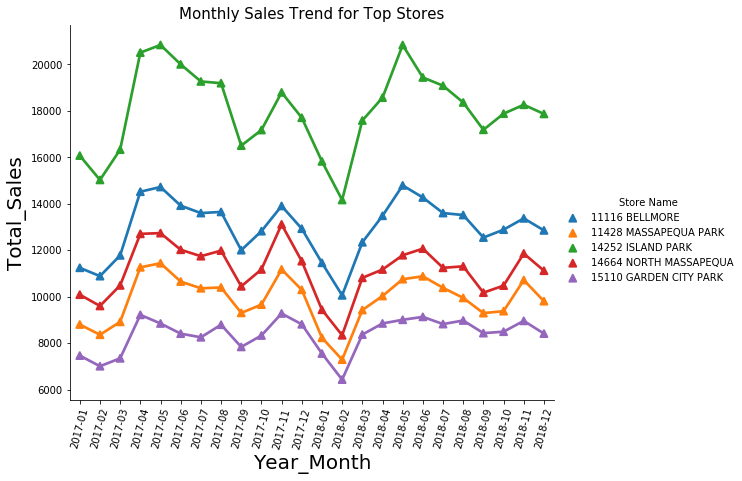

In [45]:

# the size of A4 paper

plt.figure(figsize=(30, 15))
sns.catplot(x="Yr_Mth", y="Total_Sales", hue="Store Name",dashes=False,markers='^', data=large_stores,kind='point',height=6, aspect=8/6)

plt.title('Monthly Sales Trend for Top Stores',size=15)   
plt.tick_params(axis ='x', rotation = 75)
plt.ylabel('Total_Sales', fontsize=20)
plt.xlabel('Year_Month', fontsize=20)


Text(0.5, 21.706249999999983, 'Year_Month')

<Figure size 2160x1080 with 0 Axes>

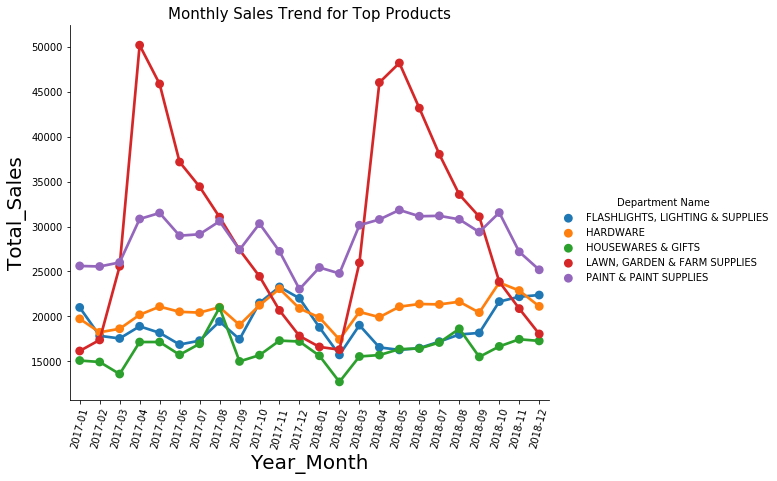

In [46]:
plt.figure(figsize=(30, 15))
sns.catplot(x="Yr_Mth", y="Total_Sales", hue="Department Name",markers='o', data=large_dpt,kind='point',height=6, aspect=8/6)

plt.title('Monthly Sales Trend for Top Products',size=15)   
plt.tick_params(axis ='x', rotation = 75)
plt.ylabel('Total_Sales', fontsize=20)
plt.xlabel('Year_Month', fontsize=20)


In [88]:
large_dpt['Department Name'].unique()

array(['FLASHLIGHTS, LIGHTING & SUPPLIES', 'HARDWARE',
       'LAWN, GARDEN & FARM SUPPLIES', 'PAINT & PAINT SUPPLIES',
       'PLUMBING SUPPLIES & FIXTURES'], dtype=object)

In [98]:

top_dept= ['FLASHLIGHTS, LIGHTING & SUPPLIES', 'HARDWARE',
       'PLUMBING SUPPLIES & FIXTURES', 'LAWN, GARDEN & FARM SUPPLIES',
       'PAINT & PAINT SUPPLIES']

top_dept= pd.DataFrame(top_dept)
top_dept.columns = ['Department Name']

grp_city_dpt_trxns= df_sample.groupby(['state_name','Department Name'])[('Receipt Number')].nunique().reset_index()

grp_city_dpt_trxns= pd.merge(grp_city_dpt_trxns, top_dept,on='Department Name')

large_city_dpt= df_sample.groupby(['state_name'])[('Receipt Number')].nunique().reset_index()

large_city_dpt=large_city_dpt.nlargest(10, 'Receipt Number')
large_city_dpt.columns=  ['state_name', 'Total Sales'] 
large_city_dpt= pd.merge(grp_city_dpt_trxns, large_city_dpt,on='state_name')
large_city_dpt.columns = ['state_name','Department Name','Total_Sales','Total_24MSales']



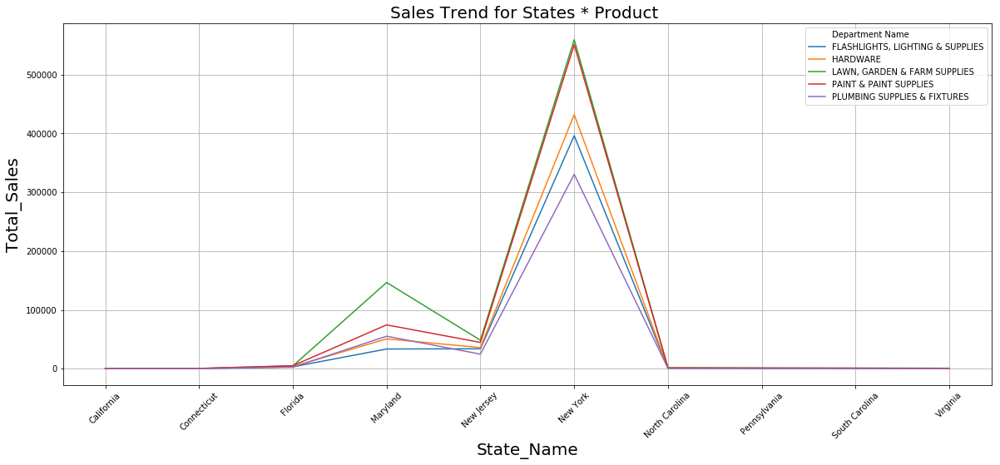

In [100]:
fig, ax = plt.subplots()
fig.set_size_inches(20, 8)
sns.lineplot(x="state_name", y="Total_Sales", hue="Department Name",markers = ["^"], data=large_city_dpt)
plt.title('Sales Trend for States * Product ',size=20) 

plt.tick_params(axis ='x', rotation = 45)
plt.ylabel('Total_Sales', fontsize=20)
plt.xlabel('State_Name', fontsize=20)
plt.grid(True)


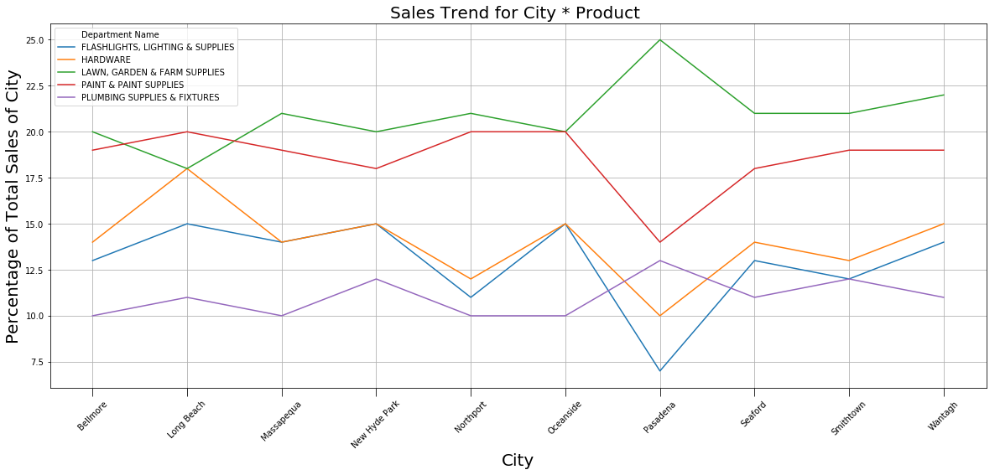

In [101]:
top_dept= ['FLASHLIGHTS, LIGHTING & SUPPLIES', 'HARDWARE',
       'PLUMBING SUPPLIES & FIXTURES', 'LAWN, GARDEN & FARM SUPPLIES',
       'PAINT & PAINT SUPPLIES']

top_dept= pd.DataFrame(top_dept)
top_dept.columns = ['Department Name']

grp_city_dpt_trxns= df_sample.groupby(['city','Department Name'])[('Receipt Number')].nunique().reset_index()

grp_city_dpt_trxns= pd.merge(grp_city_dpt_trxns, top_dept,on='Department Name')

large_city_dpt= df_sample.groupby(['city'])[('Receipt Number')].nunique().reset_index()

large_city_dpt=large_city_dpt.nlargest(10, 'Receipt Number')
large_city_dpt.columns=  ['city', 'Total Sales'] 
large_city_dpt= pd.merge(grp_city_dpt_trxns, large_city_dpt,on='city')
large_city_dpt.columns = ['city','Department Name','Total_Sales','Total_24MSales']

large_city_dpt['percentage_total_sales']= round(large_city_dpt['Total_Sales']*100/large_city_dpt['Total_24MSales'],0)
fig, ax = plt.subplots()
fig.set_size_inches(20, 8)

sns.lineplot(x="city", y="percentage_total_sales", hue="Department Name",markers = ["^"], data=large_city_dpt)
# sns.boxplot(x="city", y="Total_Sales", hue="Department Name",data=large_city_dpt)

plt.title('Sales Trend for City * Product ',size=20) 

plt.tick_params(axis ='x', rotation = 45,length =10)
plt.ylabel('Percentage of Total Sales of City', fontsize=20)
plt.xlabel('City', fontsize=20)
plt.grid(True)


In [102]:
grp_dpt_sub_txns= df_sample.groupby(['Department Name','Class Name'])[('Receipt Number')].nunique().reset_index()
grp_dpt_sub_txns= pd.merge(grp_dpt_sub_txns, top_dept,on='Department Name')
grp_dpt_sub_txns.columns = ['Product','Class_of_Product','Total_Sales']

grp_dpt_sub_txns['Class_of_Product'].nunique()
grp_dpt_sub_txns["rank"] = grp_dpt_sub_txns.groupby("Product")["Total_Sales"].rank("dense", ascending=False)

grp_dpt_sub_txns = grp_dpt_sub_txns[grp_dpt_sub_txns["rank"] <=5]
grp_dpt_sub_txns['Baap']= 'Products'


grp_dpt_tot_txns= grp_dpt_sub_txns.groupby(['Product'])[('Total_Sales')].sum().reset_index()
grp_dpt_tot_txns.columns = ['Product','Product_Sales']



In [103]:
labels = list(grp_dpt_sub_txns['Class_of_Product'])
parents = list(grp_dpt_sub_txns['Product'])
values = list(grp_dpt_sub_txns['Total_Sales'])
Baap = list(grp_dpt_sub_txns['Baap'])

uniq_parents = list(grp_dpt_sub_txns['Product'].unique())

labels=  uniq_parents + labels
parents = Baap[0:len(uniq_parents)] + parents

value_uniq_parent = list(grp_dpt_tot_txns['Product_Sales'])

values =  value_uniq_parent + values


In [3]:
from plotly.subplots import make_subplots

fig = make_subplots(
    cols = 1, rows = 1,
    column_widths = [0.9],
    subplot_titles = ('branchvalues: <b>remainder<br />&nbsp;<br />'),
    specs = [[{'type': 'treemap', 'rowspan': 1}]]    
)

fig.update_layout(
    autosize=False,
    width=1100,
    height=800,font=dict(size=20),
    xaxis=go.layout.XAxis(        
        titlefont=dict(size=20)
    )
)

fig.add_trace(go.Treemap(
    labels = labels,
    parents = parents,
    values =  values,
    textinfo = "label+value+percent parent+percent entry+percent root",
    ), row = 1, col = 1)


In [ ]:
var1= 'city'
var2= 'Department Name'



In [ ]:
tmp= df_sample.groupby([var1,var2])[('Receipt Number')].nunique().reset_index()
tmp= pd.merge(tmp, top_dept,on='Department Name')
tmp.columns = [var1,var2,'Total_Sales']

grp_dpt_sub_txns['Class_of_Product'].nunique()
grp_dpt_sub_txns["rank"] = grp_dpt_sub_txns.groupby("Product")["Total_Sales"].rank("dense", ascending=False)

grp_dpt_sub_txns = grp_dpt_sub_txns[grp_dpt_sub_txns["rank"] <=5]
grp_dpt_sub_txns['Baap']= 'Products'


grp_dpt_tot_txns= grp_dpt_sub_txns.groupby(['Product'])[('Total_Sales')].sum().reset_index()
grp_dpt_tot_txns.columns = ['Product','Product_Sales']

In [ ]:
labels = list(grp_dpt_sub_txns['Class_of_Product'])
parents = list(grp_dpt_sub_txns['Product'])
values = list(grp_dpt_sub_txns['Total_Sales'])
Baap = list(grp_dpt_sub_txns['Baap'])

uniq_parents = list(grp_dpt_sub_txns['Product'].unique())

labels=  uniq_parents + labels
parents = Baap[0:len(uniq_parents)] + parents

value_uniq_parent = list(grp_dpt_tot_txns['Product_Sales'])

values =  value_uniq_parent + values

In [ ]:
fig = make_subplots(
    cols = 1, rows = 1,
    column_widths = [0.9],
    subplot_titles = ('branchvalues: <b>remainder<br />&nbsp;<br />'),
    specs = [[{'type': 'treemap', 'rowspan': 1}]]    
)

fig.update_layout(
    autosize=False,
    width=1100,
    height=800,font=dict(size=20),
    xaxis=go.layout.XAxis(        
        titlefont=dict(size=20)
    )
)

fig.add_trace(go.Treemap(
    labels = labels,
    parents = parents,
    values =  values,
    textinfo = "label+value+percent parent+percent entry+percent root",
    ), row = 1, col = 1)

### Customer Segmentation

One goal of doing this is to best describe the variation in the different types of customers that a retail store interacts with. Doing so would equip the retailer with insight into how to best structure their delivery service to meet the needs of each customer.

In [11]:
# Import libraries necessary for this project
import numpy as np
import pandas as pd
from IPython.display import display # Allows the use of display() for DataFrames
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

import seaborn as sns
import matplotlib.pyplot as plt
# Pretty display for notebooks
%matplotlib inline

### Step 1: Calculate the RFM metrics for each customer

In [13]:
df_sample['Store Name'].unique()

array(['11730 BETHPAGE', '15863 COPIAGUE', '14822 NORTHPORT',
       '16147 CALDWELL', '15348 ROCKY POINT', '6910 FARMINGDALE',
       '11116 BELLMORE', '16354 LINCOLN PARK', '15110 GARDEN CITY PARK',
       '3164 NESCONSET', '14070 NEW HYDE PARK', '16660 GLEN BURNIE',
       '14252 ISLAND PARK', '5144 DEER PARK AVE', '16663 EDGEWATER',
       '14664 NORTH MASSAPEQUA', '16324 BROOKLYN', '15280 EAST ISLIP',
       '15998 BALDWIN HARBOR', '15238 SMITHTOWN', '16661 PASADENA',
       '15784 EI PAINT', '16038 NORTH BELLMORE', '12168 WEST ISLIP',
       '11428 MASSAPEQUA PARK', '14874 WEST BABYLON', '15444 GREAT NECK',
       '7504 GRAND BLVD', '16476 MELVILLE', '13168 BOHEMIA WAREHOUSE',
       '16791 STATEN ISLAND'], dtype=object)

In [14]:
df_sample.state_name.unique()

array([nan, 'New York', 'Tennessee', 'Maryland', 'New Jersey', 'Delaware',
       'Florida', 'North Carolina', 'Virginia', 'Massachusetts',
       'Pennsylvania', 'South Carolina', 'Connecticut', 'New Hampshire',
       'Texas', 'Michigan', 'Arizona', 'District of Columbia',
       'New Mexico', 'Colorado', 'Ohio', 'California', 'Georgia',
       'West Virginia', 'Idaho', 'Illinois', 'Missouri', 'Maine',
       'Vermont', 'Indiana', 'Hawaii', 'Oklahoma', 'Washington', 'Oregon',
       'Nevada', 'Utah', 'Wisconsin', 'Nebraska', 'Puerto Rico',
       'Kentucky', 'Mississippi', 'Louisiana', 'Rhode Island', 'Kansas',
       'Alabama', 'Minnesota', 'Iowa', 'Arkansas', 'Alaska', 'Wyoming',
       'North Dakota', 'South Dakota', 'Montana'], dtype=object)

In [18]:
print('Total Number of Unique Customer Samples: ' + str(df_sample['Customer Number'].nunique()))
customer_state=df_sample[['state_name','Customer Number']].drop_duplicates()
customer_state.groupby(['state_name'])['Customer Number'].aggregate('count').reset_index().sort_values('Customer Number', ascending=False)


Total Number of Unique Customer Samples: 349345


,state_name,Customer Number
32,New York,275198
20,Maryland,42742
30,New Jersey,20168
9,Florida,3104
33,North Carolina,837
38,Pennsylvania,791
47,Virginia,554
41,South Carolina,520
4,California,369
6,Connecticut,302


In [19]:
df_sample = df_sample.loc[df_sample['state_name'] == 'New York']

In [20]:
##Remove the negative values in Net Sales column.

df_sample = df_sample[(df_sample['Net Sales Units']>0)]
df_sample.shape


(8765826, 42)

In [21]:
print('Min Time : ' + str(df_sample['Date'].min()))
print('Max Time : ' + str(df_sample['Date'].max()))


Min Time : 2017-01-01
Max Time : 2018-12-31


Since recency is calculated for a point in time, and the last invoice date is 2011–12–09, we will use 2018-12-31 to calculate recency.

### Create a RFM table

In [22]:
df_sample['InvoiceNo'] = df_sample['Receipt Number'] + df_sample['Store Name']
max_time = dt.datetime(2018,12,31)

In [24]:
## Change the flag if for 6Months
last6m= 'yes'

In [25]:
if last6m == 'yes':
    rfmTable= df_sample[(df_sample.Date >= '2018-07-01')]
if last6m == 'no':
    rfmTable = df_sample.copy()

In [26]:
rfmTable.shape

(2253787, 43)

In [28]:
rfmTable.dtypes

Date                           object
Transaction Time               object
Customer Number                object
Receipt Number                 object
Store #                       float64
Store Name                     object
Scanned UPC                    object
Item Number                   float64
Item Description               object
Net Sales Units               float64
Net Sales                     float64
Cost                          float64
Gross Margin                  float64
Gross Margin %                 object
Department Code                object
Department Name                object
Class Code                     object
Class Name                     object
Fineline Code                  object
Fineline Name                  object
Item was Scanned              float64
MIP Promo ID                   object
Promo/Discount                 object
Dynamic Promo ID              float64
Actual Price                  float64
Retail Price                  float64
Actual-Retai

In [29]:
rfmTable.Date=pd.to_datetime(rfmTable.Date)

In [30]:
rfmTable = rfmTable.groupby('Customer Number').agg({'Date': lambda x: (max_time - x.max()).days, 'InvoiceNo': lambda x: len(x), 'Retail Price': lambda x: x.sum()})
rfmTable['Date'] = rfmTable['Date'].astype(int)
rfmTable= rfmTable.reset_index()
rfmTable.rename(columns={'Customer_Number': 'Customer_Number',
                         'Date': 'recency', 
                         'InvoiceNo': 'frequency', 
                         'Retail Price': 'monetary_value'}, inplace=True)


In [34]:
rfmTable.tail()

,Customer Number,frequency,recency,monetary_value
197376,9993,20,9,117.33
197377,9996,2,129,22.48
197378,9997,2,177,14.98
197379,999771,3,95,29.97
197380,99995,7,8,81.93


Interpretation:
CustomerID 999771 has frequency: 3, monetary value: $29.97 and recency: 95 days

CustomerID 9993 has frequency: 20, monetary value: $117.33 and recency: 9 days

Split the metrics using quartiles

In [35]:
quantiles = rfmTable.quantile(q=[0.25,0.5,0.75])
quantiles = quantiles.to_dict()
quantiles

{'frequency': {0.25: 3.0, 0.5: 6.0, 0.75: 14.0},
 'monetary_value': {0.25: 22.17,
  0.5: 58.940000000000005,
  0.75: 138.92000000000002},
 'recency': {0.25: 15.0, 0.5: 37.0, 0.75: 85.0}}

### Create a segmented RFM table

The lowest recency, highest frequency and monetary amounts are our best customers

In [36]:
def RScore(x,p,d):
    if x <= d[p][0.25]:
        return 1
    elif x <= d[p][0.50]:
        return 2
    elif x <= d[p][0.75]: 
        return 3
    else:
        return 4
    
def FMScore(x,p,d):
    if x <= d[p][0.25]:
        return 4
    elif x <= d[p][0.50]:
        return 3
    elif x <= d[p][0.75]: 
        return 2
    else:
        return 1

Add segment numbers to the newly created segmented RFM table

In [37]:
rfmTable['r_quartile'] = rfmTable['recency'].apply(RScore, args=('recency',quantiles,))
rfmTable['f_quartile'] = rfmTable['frequency'].apply(FMScore, args=('frequency',quantiles,))
rfmTable['m_quartile'] = rfmTable['monetary_value'].apply(FMScore, args=('monetary_value',quantiles,))
rfmTable.head()

,Customer Number,frequency,recency,monetary_value,r_quartile,f_quartile,m_quartile
0,*0,19,9,463.55,1,1,1
1,*1,13,17,107.04,2,2,2
2,*10,3,60,3.49,3,4,4
3,*1000,2,161,9.98,4,4,4
4,*10005,13,2,59.40,1,2,2


In [38]:
rfmTable['RFMScore'] = rfmTable.r_quartile.map(str) + rfmTable.f_quartile.map(str) + rfmTable.m_quartile.map(str)


In [39]:
rfmTable.head()

,Customer Number,frequency,recency,monetary_value,r_quartile,f_quartile,m_quartile,RFMScore
0,*0,19,9,463.55,1,1,1,111
1,*1,13,17,107.04,2,2,2,222
2,*10,3,60,3.49,3,4,4,344
3,*1000,2,161,9.98,4,4,4,444
4,*10005,13,2,59.40,1,2,2,122


In [40]:
rfmTable['RFMScore'] = rfmTable['RFMScore'].astype(int)
rfmTable['cust_seg'] = np.where(rfmTable['RFMScore']==111, 'BestCustomers',
                                np.where(rfmTable['RFMScore']==444,'LostCheapCustomers',
                                         np.where((rfmTable['RFMScore'] ==311) | (rfmTable['RFMScore'] ==411),'LostBestCustomers',
                                                np.where( (rfmTable['r_quartile']>=3) & (rfmTable['f_quartile']>1) & (rfmTable['m_quartile']==1),'LostBigSpenders',
                                                     np.where( (rfmTable['r_quartile']==1) & (rfmTable['f_quartile']==1),'Loyal Customers',
                                                          np.where(rfmTable['m_quartile']==1,'BigSpenders','other'
                                                                  ))))))


Pie Chart Showing Percentage Customers in different RFM Segment


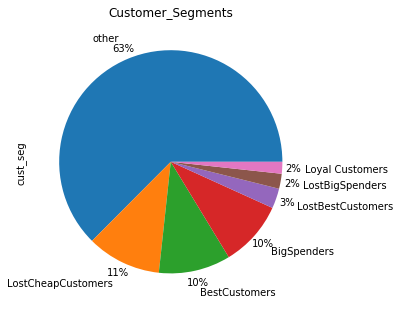

In [88]:
import plotly.graph_objs as go
grouped=rfmTable['cust_seg'].value_counts()
grouped = grouped.reset_index()
grouped.columns = ['Customer_Segments','Users']

# Use `hole` to create a donut-like pie chart
print('Pie Chart Showing Percentage Customers in different RFM Segment')
# fig = go.Figure(data=[go.Pie(labels=grouped['cust_seg'], values=grouped['Users'], hole=.3)])
# plotly.offline.iplot(fig)



rfmTable['cust_seg'].value_counts().plot(
    kind='pie',
    title= 'Customer_Segments',
    figsize=(5,10),autopct='%1.0f%%',pctdistance=1.1, labeldistance=1.2
#     cmap="rgb", # defaults to orangish
)


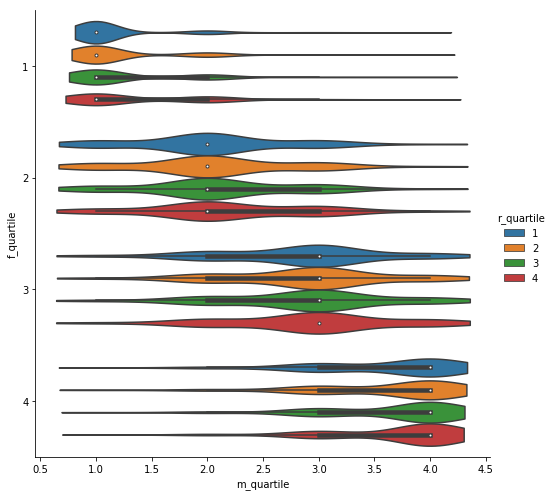

In [98]:
sns.catplot(x="m_quartile", y="f_quartile",
            hue="r_quartile", #col="m_quartile",
            data=rfmTable[rfmTable.f_quartile.notnull()],
            orient="h", height=7, aspect=1, palette="tab10",
            kind="violin", dodge=True, cut=1, bw=0.5)


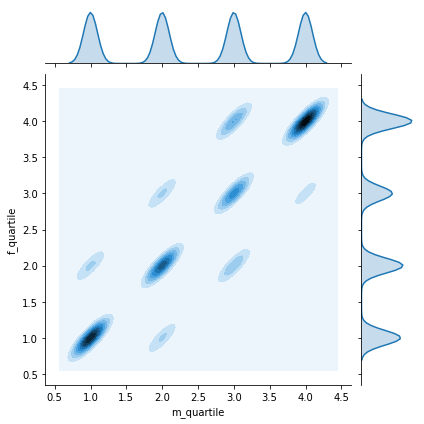

In [96]:
# Load Dataset
# Plot


sns.jointplot(x="m_quartile", y="f_quartile",hue="r_quartile", kind='kde',data=rfmTable[rfmTable.f_quartile.notnull()])
# sns.jointplot(x=df["sepal_length"], y=df["sepal_width"], kind='hex')
# sns.jointplot(x=df["sepal_length"], y=df["sepal_width"], kind='kde')




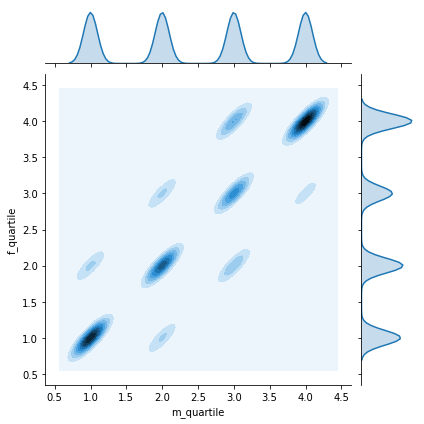

In [97]:
sns.jointplot(x="m_quartile", y="f_quartile",hue="r_quartile", kind='kde',data=rfmTable[rfmTable.f_quartile.notnull()])


In [99]:
# Define the aggregation calculations
aggregations = {
    'recency': ["mean","median"],
    'frequency': ["mean","median"],
    'monetary_value': ["mean","median"] 
}
rfmTable.groupby(['cust_seg']).agg(aggregations)

monetary_value           frequency            recency  \
                             mean   median       mean median        mean   
cust_seg                                                                   
BestCustomers          419.022822  290.075  38.368150     29    6.453276   
BigSpenders            282.464009  219.490  23.005799     20   22.137841   
LostBestCustomers      267.654459  220.285  23.971629     21   61.355166   
LostBigSpenders        222.349260  178.960   9.111759     10   80.321512   
LostCheapCustomers      10.251306    9.580   1.637956      1  132.841017   
Loyal Customers        107.916547  112.990  18.661147     17    6.988468   
other                   52.159658   44.450   6.151185      5   53.918866   

                           
                   median  
cust_seg                   
BestCustomers           7  
BigSpenders            22  
LostBestCustomers      54  
LostBigSpenders        71  
LostCheapCustomers    132  
Loyal Customers         8  
other                  42

In [101]:
df_sample= pd.merge(df_sample,rfmTable,on='Customer Number')

In [102]:
# Define the aggregation calculations
aggregations = {
    'Customer Number': ["nunique"],
    'InvoiceNo': ["count"],
    'Actual Price': ["median"] 
}
seg_time_price=df_sample.groupby(['cust_seg','Yr_Mth']).agg(aggregations).reset_index()
seg_time_price= seg_time_price.as_matrix()
seg_time_price=pd.DataFrame(seg_time_price)
seg_time_price.columns=['customer_seg', 'Yr_Mth','Users','Sales','AveragePrice']
seg_time_price["Sales"] = seg_time_price["Sales"].astype(int)
seg_time_price["SalesPerCust"] = seg_time_price["Sales"]/seg_time_price["Users"]


In [103]:
seg_time_price.head()

,customer_seg,Yr_Mth,Users,Sales,AveragePrice,SalesPerCust
0,BestCustomers,2017-01,12224,82278,5.99,6.73086
1,BestCustomers,2017-02,12271,80077,5.99,6.52571
2,BestCustomers,2017-03,12477,83569,5.99,6.69784
3,BestCustomers,2017-04,13692,107075,5.99,7.82026
4,BestCustomers,2017-05,13647,102957,5.99,7.5443


In [104]:
var= 'SalesPerCust'
seg_time_price[var] = seg_time_price[var].astype(int)
seg_time_price["AveragePrice"] = seg_time_price["AveragePrice"].astype(int)
seg_time_price.dtypes


customer_seg    object
Yr_Mth          object
Users           object
Sales            int64
AveragePrice     int64
SalesPerCust     int64
dtype: object

In [105]:
seg_time_price.customer_seg.unique()

array(['BestCustomers', 'BigSpenders', 'LostBestCustomers',
       'LostBigSpenders', 'LostCheapCustomers', 'Loyal Customers',
       'other'], dtype=object)

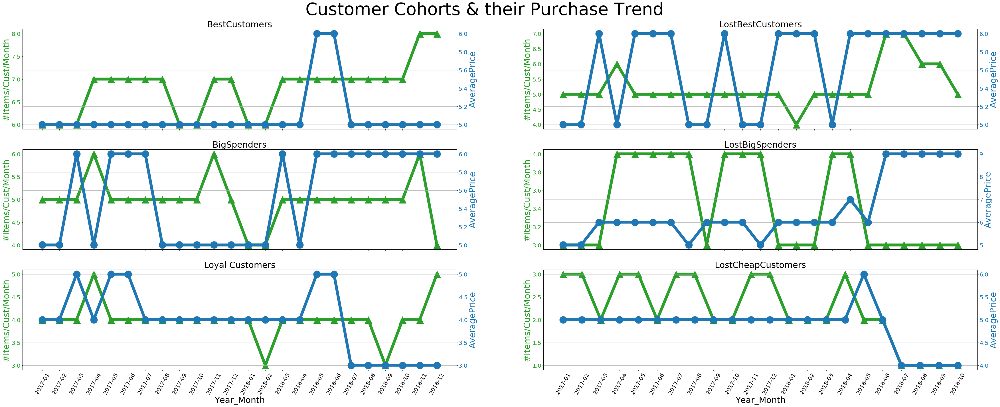

In [138]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

var= 'SalesPerCust'

fig = plt.figure(figsize=(60, 22))

gs = gridspec.GridSpec(3, 2)

#----  Best Customers----#
data = seg_time_price.loc[seg_time_price['customer_seg'].isin(['BestCustomers'])]

ax1 = plt.subplot(gs[0, 0])

color = 'tab:green'
# ax1.set_xlabel('Year_Month',size=30)
ax1.set_ylabel('#Items/Cust/Month', color=color,size=30)
ax1.plot(data["Yr_Mth"], data[var],color=color,marker='^',lw=10,ms=25)
ax1.tick_params(axis='y', labelcolor=color)
# plt.xticks(rotation=60)
ax1.set_xticklabels([])
ax1.tick_params(axis='both', which='major', labelsize=20)

color = 'tab:blue'
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

ax2.set_ylabel('AveragePrice', color=color,size=30)
ax2.plot(data["Yr_Mth"], data["AveragePrice"],color=color,marker='o',lw=10,ms=25)
ax2.tick_params(axis='y', labelcolor=color)
plt.grid(True)
plt.title('BestCustomers',size= 30)
ax2.set_xticklabels([])

ax2.tick_params(axis='both', which='major', labelsize=20)

#---- Lost Best Customers----#

ax1 = plt.subplot(gs[0, 1])
data = seg_time_price.loc[seg_time_price['customer_seg'].isin(['LostBestCustomers'])]


color = 'tab:green'
# ax1.set_xlabel('Year_Month',size=30)
ax1.set_ylabel('#Items/Cust/Month', color=color,size=30)
ax1.plot(data["Yr_Mth"], data[var],color=color,marker='^',lw=10,ms=25)
ax1.tick_params(axis='y', labelcolor=color)
# plt.xticks(rotation=60)
ax1.set_xticklabels([])
ax1.tick_params(axis='both', which='major', labelsize=20)

color = 'tab:blue'
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

ax2.set_ylabel('AveragePrice', color=color,size=30)
ax2.plot(data["Yr_Mth"], data["AveragePrice"],color=color,marker='o',lw=10,ms=25)
ax2.tick_params(axis='y', labelcolor=color)
plt.grid(True)
plt.title('LostBestCustomers',size= 30)
ax2.set_xticklabels([])
ax2.tick_params(axis='both', which='major', labelsize=20)

#---- BigSpenders----#

ax1 = plt.subplot(gs[1, 0])
data = seg_time_price.loc[seg_time_price['customer_seg'].isin(['BigSpenders'])]


color = 'tab:green'
# ax1.set_xlabel('Year_Month',size=30)
ax1.set_ylabel('#Items/Cust/Month', color=color,size=30)
ax1.plot(data["Yr_Mth"], data[var],color=color,marker='^',lw=10,ms=25)
ax1.tick_params(axis='y', labelcolor=color)
# plt.xticks(rotation=60)
ax1.set_xticklabels([])
ax1.tick_params(axis='both', which='major', labelsize=20)

color = 'tab:blue'
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

ax2.set_ylabel('AveragePrice', color=color,size=30)
ax2.plot(data["Yr_Mth"], data["AveragePrice"],color=color,marker='o',lw=10,ms=25)
ax2.tick_params(axis='y', labelcolor=color)
plt.grid(True)
plt.title('BigSpenders',size= 30)
ax2.set_xticklabels([])
ax2.tick_params(axis='both', which='major', labelsize=20)

#---- LostBestCustomers----#

ax1 = plt.subplot(gs[1, 1])
data = seg_time_price.loc[seg_time_price['customer_seg'].isin(['LostBigSpenders'])]


color = 'tab:green'
# ax1.set_xlabel('Year_Month',size=30)
ax1.set_ylabel('#Items/Cust/Month', color=color,size=30)
ax1.plot(data["Yr_Mth"], data[var],color=color,marker='^',lw=10,ms=25)
ax1.tick_params(axis='y', labelcolor=color)
# plt.xticks(rotation=60)
ax1.set_xticklabels([])
ax1.tick_params(axis='both', which='major', labelsize=20)

color = 'tab:blue'
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

ax2.set_ylabel('AveragePrice', color=color,size=30)
ax2.plot(data["Yr_Mth"], data["AveragePrice"],color=color,marker='o',lw=10,ms=25)
ax2.tick_params(axis='y', labelcolor=color)
plt.grid(True)
plt.title('LostBigSpenders',size= 30)
ax2.set_xticklabels([])
ax2.tick_params(axis='both', which='major', labelsize=20)


#---- Loyal Customers----#

ax1 = plt.subplot(gs[2, 0])
data = seg_time_price.loc[seg_time_price['customer_seg'].isin(['Loyal Customers'])]


color = 'tab:green'
ax1.set_xlabel('Year_Month',size=30)
ax1.set_ylabel('#Items/Cust/Month', color=color,size=30)
ax1.plot(data["Yr_Mth"], data[var],color=color,marker='^',lw=10,ms=25)
ax1.tick_params(axis='y', labelcolor=color)
plt.xticks(rotation=60)
ax1.tick_params(axis='both', which='major', labelsize=20)

color = 'tab:blue'
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

ax2.set_ylabel('AveragePrice', color=color,size=30)
ax2.plot(data["Yr_Mth"], data["AveragePrice"],color=color,marker='o',lw=10,ms=25)
ax2.tick_params(axis='y', labelcolor=color)
plt.grid(True)
plt.title('Loyal Customers',size= 30)
ax2.tick_params(axis='both', which='major', labelsize=20)

#---- LostCheapCustomers----#

ax1 = plt.subplot(gs[2, 1])
data = seg_time_price.loc[seg_time_price['customer_seg'].isin(['LostCheapCustomers'])]


color = 'tab:green'
ax1.set_xlabel('Year_Month',size=30)
ax1.set_ylabel('#Items/Cust/Month', color=color,size=30)
ax1.plot(data["Yr_Mth"], data[var],color=color,marker='^',lw=10,ms=25)
ax1.tick_params(axis='y', labelcolor=color)
plt.xticks(rotation=60)
ax1.tick_params(axis='both', which='major', labelsize=20)

color = 'tab:blue'
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

ax2.set_ylabel('AveragePrice', color=color,size=30)
ax2.plot(data["Yr_Mth"], data["AveragePrice"],color=color,marker='o',lw=10,ms=25)
ax2.tick_params(axis='y', labelcolor=color)
plt.grid(True)
plt.title('LostCheapCustomers',size= 30)
ax2.tick_params(axis='both', which='major', labelsize=20)

plt.suptitle('Customer Cohorts & their Purchase Trend', y=0.94, fontsize=60)
plt.show()


In [123]:
df_sample.head()

,Date,Transaction Time,Customer Number,Receipt Number,Store #,Store Name,Scanned UPC,Item Number,Item Description,Net Sales Units,...,Yr_Mth,InvoiceNo,frequency,recency,monetary_value,r_quartile,f_quartile,m_quartile,RFMScore,cust_seg
0,2017-01-04,7:02:55,290074,D70801,NaN,15863 COPIAGUE,OTHER,7158314.0,ACE FERT 4STEP 5M,1.0,...,2017-01,D7080115863 COPIAGUE,27,8,288.35,1,1,1,111,BestCustomers
1,2017-07-04,20:26:25,290074,C31668,7.0,12168 WEST ISLIP,OTHER,81995.0,BIRDSEED WILDBIRD 20#ACE,1.0,...,2017-07,C3166812168 WEST ISLIP,27,8,288.35,1,1,1,111,BestCustomers
2,2017-11-04,6:13:25,290074,G19059,9.0,11730 BETHPAGE,OTHER,81995.0,BIRDSEED WILDBIRD 20#ACE,2.0,...,2017-11,G1905911730 BETHPAGE,27,8,288.35,1,1,1,111,BestCustomers
3,2017-12-04,20:31:29,290074,A44138,NaN,14822 NORTHPORT,79545400033,NaN,COSTELLO'S SUN & SHADE 3#,1.0,...,2017-12,A4413814822 NORTHPORT,27,8,288.35,1,1,1,111,BestCustomers
4,2017-12-04,20:31:29,290074,A44138,NaN,14822 NORTHPORT,71693222864,NaN,LIBERTY GARDEN SEEDS-ASSORTED,2.0,...,2017-12,A4413814822 NORTHPORT,27,8,288.35,1,1,1,111,BestCustomers


In [125]:
df_sample.shape

(8180774, 51)

In [139]:
df_sample.to_csv('./data_processed_segments.csv', index=False)

### Establishing Association of Items in Basket

##Reference Market Basket Analysis
https://pbpython.com/market-basket-analysis.html

In [140]:
import pandas as pd
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

In [142]:
print('\033[1m' + 'Total Unique Items OverAll:' + str(df_sample['Item Description'].nunique()))
print('\033[1m' + 'Total Unique Fineline Name OverAll:' + str(df_sample['Fineline Name'].nunique()))
print('\033[1m' + 'Total Unique Class Name OverAll:' + str(df_sample['Class Name'].nunique()))
print('\033[1m' + 'Total Unique Department Name OverAll:' + str(df_sample['Department Name'].nunique()))


Total Unique Items OverAll:86084
Total Unique Fineline Name OverAll:2783
Total Unique Class Name OverAll:618
Total Unique Department Name OverAll:48


In [143]:
ass_dt = df_sample.copy()

var= 'Class Name'
ass_dt[var] = ass_dt[var].str.replace(" ", "")
ass_dt.dropna(axis=0, subset=['InvoiceNo'], inplace=True)
ass_dt['InvoiceNo'] = ass_dt['InvoiceNo'].astype('str')

cols_sel = ['InvoiceNo','Class Name']
ass_dt = ass_dt[cols_sel]
ass_dt=ass_dt.drop_duplicates()


In [212]:
basket=ass_dt.pivot(index='InvoiceNo', columns=var, values=var)

In [216]:
basket.shape

(3351604, 619)

In [214]:
cols= basket.columns
cols= cols[1:-1]

In [215]:
#bask = basket[cols].convert_objects(convert_numeric=True)

In [221]:
basket.head()

Class Name,12VOLTBATTERIES,A/C&RANGEHOODFILTERS,ABOVEGROUNDIRRIGATION,ACEAPPAREL,ACECOUPON/CREDITITEMS,ACEPAINTDIV.PRODUCTS,ACESERVICES-TRACKING,ACRYLICSHEETING,ADULTGAMES,AGRICULTURALFENCE,...,WOODPLANES/SCRAPERS,WOODPRESERVATIVES,WORKBENCHES&SAWHORSES,WORKWEAR&CLOTHING,WREATHS&GARLAND,WRECKINGBARS/PULLERS,WRENCHES,WRITINGINSTRUMENTS,YARDANDGARDENFENCING,ZIPCODES
InvoiceNo,,,,,,,,,,,,,,,,,,,,,
1000014822 NORTHPORT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1000015784 EI PAINT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1000114822 NORTHPORT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1000115280 EAST ISLIP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1000115784 EI PAINT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [220]:
basket.drop(basket.columns[[0]], axis=1, inplace=True)

In [1]:
def encode_units(x):
    if (x) <= 0:
        return 0
    if (x) >= 1:
        return 1

basket_sets = basket.applymap(encode_units)

In [ ]:
basket_sets=basket_sets.fillna(0)
basket_sets.to_csv('basket_sets.csv', index=False)


In [ ]:
basket_sets= pd.read_csv('basket_sets.csv',header=None)
basket_sets.shape


In [4]:
headers = basket_sets.iloc[0]
basket_sets  = pd.DataFrame(basket_sets.values[1:], columns=headers)
# basket_sets= basket_sets.convert_objects(convert_numeric=True)

In [2]:
basket_sets.head()

In [6]:
observations = [] 
for i in range(len(basket)):
    observations.append([str(basket.values[i,j]) for j in range(618)])

In [7]:
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

In [3]:
frequent_itemsets = apriori(basket_sets, min_support=0.005, use_colnames=True)
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=1)
rules.head()

In [9]:
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(PAINT ROLLERS),(PAINT BRUSHES),0.025375,0.025678,0.007734,0.304791,11.869615,0.007082,1.401480
1,(PAINT BRUSHES),(PAINT ROLLERS),0.025678,0.025375,0.007734,0.301189,11.869615,0.007082,1.394691
2,(PAINT ROLLERS),(LIQUID PAINT- NATIONAL),0.025375,0.035395,0.009572,0.377227,10.657605,0.008674,1.548888
3,(LIQUID PAINT- NATIONAL),(PAINT ROLLERS),0.035395,0.025375,0.009572,0.270435,10.657605,0.008674,1.335898
4,(LIQUID PAINT- NATIONAL),(PAINT BRUSHES),0.035395,0.025678,0.006679,0.188696,7.348483,0.005770,1.200933
5,(PAINT BRUSHES),(LIQUID PAINT- NATIONAL),0.025678,0.035395,0.006679,0.260101,7.348483,0.005770,1.303697
6,(DONATIONS),(CHRISTMAS LIGHTS/ACCESS),0.071127,0.021368,0.005937,0.083471,3.906380,0.004417,1.067759
7,(CHRISTMAS LIGHTS/ACCESS),(DONATIONS),0.021368,0.071127,0.005937,0.277849,3.906380,0.004417,1.286259


## Forecasting

### Basic EDA

In [26]:
import warnings
import itertools
import numpy as np
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")
plt.style.use('fivethirtyeight')
import pandas as pd
import statsmodels.api as sm
import matplotlib
import plotly.express as px
matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'k'

In [4]:
df_sample= pd.read_csv("./data_processed_segments.csv")

In [5]:
df_sample.head()

,Date,Transaction Time,Customer Number,Receipt Number,Store #,Store Name,Scanned UPC,Item Number,Item Description,Net Sales Units,...,Yr_Mth,InvoiceNo,frequency,recency,monetary_value,r_quartile,f_quartile,m_quartile,RFMScore,cust_seg
0,2017-01-04,7:02:55,290074,D70801,NaN,15863 COPIAGUE,OTHER,7158314.0,ACE FERT 4STEP 5M,1.0,...,2017-01,D7080115863 COPIAGUE,27,8,288.35,1,1,1,111,BestCustomers
1,2017-07-04,20:26:25,290074,C31668,7.0,12168 WEST ISLIP,OTHER,81995.0,BIRDSEED WILDBIRD 20#ACE,1.0,...,2017-07,C3166812168 WEST ISLIP,27,8,288.35,1,1,1,111,BestCustomers
2,2017-11-04,6:13:25,290074,G19059,9.0,11730 BETHPAGE,OTHER,81995.0,BIRDSEED WILDBIRD 20#ACE,2.0,...,2017-11,G1905911730 BETHPAGE,27,8,288.35,1,1,1,111,BestCustomers
3,2017-12-04,20:31:29,290074,A44138,NaN,14822 NORTHPORT,79545400033,NaN,COSTELLO'S SUN & SHADE 3#,1.0,...,2017-12,A4413814822 NORTHPORT,27,8,288.35,1,1,1,111,BestCustomers
4,2017-12-04,20:31:29,290074,A44138,NaN,14822 NORTHPORT,71693222864,NaN,LIBERTY GARDEN SEEDS-ASSORTED,2.0,...,2017-12,A4413814822 NORTHPORT,27,8,288.35,1,1,1,111,BestCustomers


In [6]:
df_fcst = df_sample.copy()
df_fcst = df_fcst.sort_values('Date')

df_fcst.Date=pd.to_datetime(df_fcst.Date)

In [7]:
df_fcst.Yr_Mth=pd.to_datetime(df_fcst.Yr_Mth)

In [8]:

df = df_fcst.groupby('Date')['Net Sales'].sum().reset_index()
df = df.set_index('Date')

y = df['Net Sales'].resample('MS').mean()
y = pd.DataFrame(y)
y = y.reset_index()

act_data= y
act_data['Total_Sales']='OverAll Daily Costello Sales'

# y.plot(figsize=(10, 5))
# plt.show()

# sns.lmplot(x="total_bill", y="tip", data=tips)


In [9]:
import plotly.express as px
fig = px.scatter(act_data, x="Date", y="Net Sales", trendline="lowess", title = 'OverAll Net Sales Trend Month on Month')
fig.show()

In [10]:
grp_dpt_trxns= df_fcst.groupby(['Department Name','Date'])[('Net Sales')].sum().reset_index()

large_dpt= df_fcst.groupby(['Department Name'])[('Net Sales')].sum().reset_index()
large_dpt=large_dpt.nlargest(5, 'Net Sales')
large_dpt= large_dpt['Department Name']

large_dpt= pd.merge(grp_dpt_trxns, large_dpt,on='Department Name')

print(large_dpt['Department Name'].unique())
print(large_dpt.head())
large_dpt = large_dpt.set_index('Date')

large_dpt = large_dpt.groupby(['Department Name'])['Net Sales'].resample('MS').mean()
large_dpt = pd.DataFrame(large_dpt)

large_dpt = large_dpt.reset_index()
large_dpt=large_dpt.sort_values('Net Sales')

['FLASHLIGHTS, LIGHTING & SUPPLIES' 'HARDWARE'
 'LAWN, GARDEN & FARM SUPPLIES' 'OUTDOOR LIVING & FURNITURE'
 'PAINT & PAINT SUPPLIES']
                    Department Name       Date  Net Sales
0  FLASHLIGHTS, LIGHTING & SUPPLIES 2017-01-01    8277.34
1  FLASHLIGHTS, LIGHTING & SUPPLIES 2017-01-02    7547.83
2  FLASHLIGHTS, LIGHTING & SUPPLIES 2017-01-03    5503.61
3  FLASHLIGHTS, LIGHTING & SUPPLIES 2017-01-04   12467.64
4  FLASHLIGHTS, LIGHTING & SUPPLIES 2017-01-05    6020.55


In [11]:
grp_st_trxns= df_fcst.groupby(['Store Name','Date'])[('Net Sales')].sum().reset_index()

large_stores= df_fcst.groupby(['Store Name'])[('Net Sales')].sum().reset_index()
large_stores=large_stores.nlargest(5, 'Net Sales')
large_stores= large_stores['Store Name']

large_stores= pd.merge(grp_st_trxns, large_stores,on='Store Name')

print(large_stores['Store Name'].unique())
print(large_stores.head())
large_stores = large_stores.set_index('Date')

large_stores = large_stores.groupby(['Store Name'])['Net Sales'].resample('MS').mean()
large_stores = pd.DataFrame(large_stores)
large_stores = large_stores.reset_index()

['11116 BELLMORE' '11428 MASSAPEQUA PARK' '14252 ISLAND PARK'
 '14664 NORTH MASSAPEQUA' '15863 COPIAGUE']
       Store Name       Date  Net Sales
0  11116 BELLMORE 2017-01-01    9564.60
1  11116 BELLMORE 2017-01-02    6384.67
2  11116 BELLMORE 2017-01-03    5435.12
3  11116 BELLMORE 2017-01-04   14200.65
4  11116 BELLMORE 2017-01-05   13270.36


In [12]:
import plotly.express as px
fig = px.scatter(large_dpt, x="Date", y="Net Sales",color="Department Name", trendline="lowess")
fig.show()

fig = px.scatter(large_stores, x="Date", y="Net Sales",color="Store Name", trendline="lowess")
fig.show()

In [13]:
titl={
        'text': "Daily Sales Trend OverAll & Top 5 Products",
        'y':0.9,
        'x':0.5,
        'xanchor': 'right',
        'yanchor': 'top'}

fig2 = px.bar(large_dpt, x="Date", y="Net Sales",color="Department Name",title =titl)
fig = px.line(act_data, x="Date", y="Net Sales", color = "Total_Sales")
fig2.add_trace(fig.data[0])

# fig3 = px.bar(large_stores, x="Date", y="Net Sales", color = "Store Name")
# fig2.add_trace(fig3.data[0])

fig2.show()




In [14]:
large_stores['Store Name'].unique()

array(['11116 BELLMORE', '11428 MASSAPEQUA PARK', '14252 ISLAND PARK',
       '14664 NORTH MASSAPEQUA', '15863 COPIAGUE'], dtype=object)

## Top Stores & thier Top Products

['11116 BELLMORE' '11428 MASSAPEQUA PARK' '14252 ISLAND PARK'
 '14664 NORTH MASSAPEQUA' '15863 COPIAGUE']
       Store Name               Class Name  Net Sales
0  11116 BELLMORE        12 VOLT BATTERIES    1471.81
1  11116 BELLMORE  A/C & RANGEHOOD FILTERS    1236.18
2  11116 BELLMORE  ABOVE GROUND IRRIGATION   23462.77
3  11116 BELLMORE  ACE COUPON/CREDIT ITEMS    2761.49
4  11116 BELLMORE  ACE PAINT DIV. PRODUCTS   36690.05


Text(0.5, 0, 'Top 5 Stores & Their Most Sold Products')

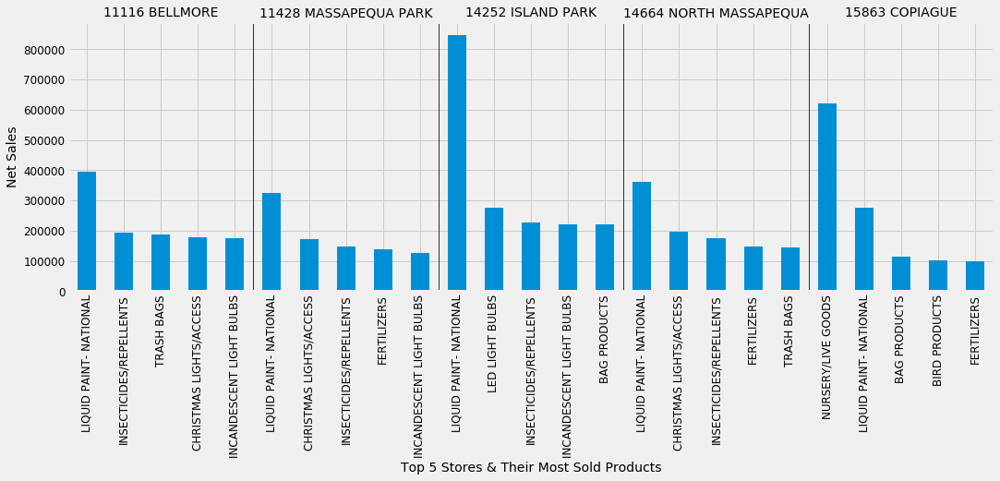

In [15]:
var= 'Class Name'
grp_st_prod_trxns= df_fcst.groupby(['Store Name',var])[('Net Sales')].sum().reset_index()

large_stores= df_fcst.groupby(['Store Name'])[('Net Sales')].sum().reset_index()
large_stores=large_stores.nlargest(5, 'Net Sales')
large_stores= large_stores['Store Name']

large_stores= pd.merge(grp_st_prod_trxns, large_stores,on='Store Name')

print(large_stores['Store Name'].unique())
print(large_stores.head())


group = large_stores.groupby(["Store Name",var]).sum()
total_sales = group["Net Sales"].groupby(level=0, group_keys=False)
gtp = total_sales.nlargest(5)


ax = gtp.plot(kind="bar",figsize= (16,5))


#draw lines and titles
count = gtp.groupby("Store Name").count()
cs = np.cumsum(count)
for i in range(len(count)):
    title = count.index.values[i]
    ax.axvline(cs[i]-.5, lw=0.8, color="k")
    ax.text(cs[i]-(count[i]+1)/2., 1.02, title, ha="center",
            transform=ax.get_xaxis_transform())

# shorten xticklabels
ax.set_xticklabels([l.get_text().split(", ")[1][:-1] for l in ax.get_xticklabels()])
# ax.set_title('scas',loc='center', fontdict= {'verticalalignment': 'top'},pad=None)
ax.set_ylabel('Net Sales')
ax.set_xlabel('Top 5 Stores & Their Most Sold Products')



## Customer Segments & their Top Products

['BestCustomers' 'BigSpenders' 'LostBestCustomers' 'LostBigSpenders'
 'LostCheapCustomers' 'Loyal Customers' 'other']
        cust_seg               Class Name  Net Sales
0  BestCustomers        12 VOLT BATTERIES    4586.54
1  BestCustomers  A/C & RANGEHOOD FILTERS    2369.08
2  BestCustomers  ABOVE GROUND IRRIGATION   62366.81
3  BestCustomers              ACE APPAREL     115.87
4  BestCustomers  ACE COUPON/CREDIT ITEMS    7159.16


Text(0.5, 0, 'Customer Segments & Their Most Bought Products')

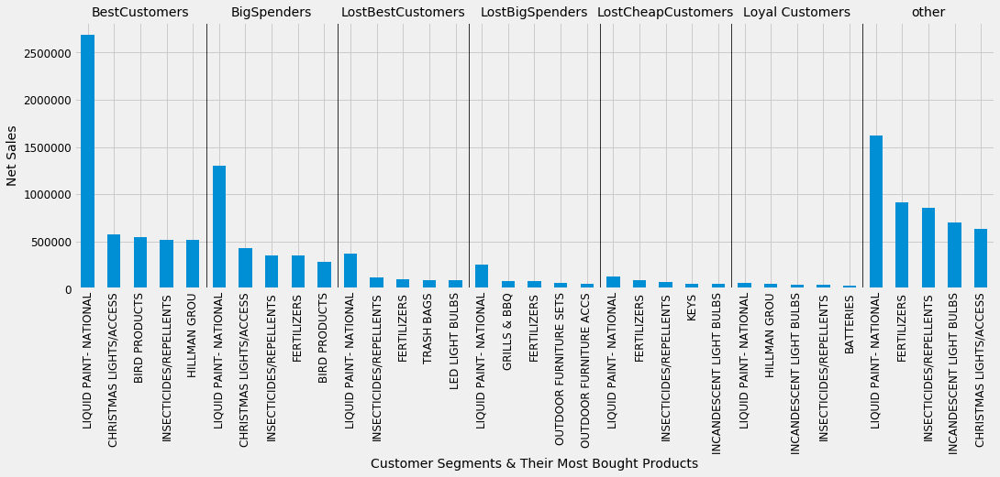

In [16]:
var1= 'cust_seg'
var2= 'Class Name'
grp_st_prod_trxns= df_fcst.groupby([var1,var2])[('Net Sales')].sum().reset_index()

large_stores= df_fcst.groupby([var1])[('Net Sales')].sum().reset_index()
# large_stores=large_stores.nlargest(5, 'Net Sales')
large_stores= large_stores[var1]

large_stores= pd.merge(grp_st_prod_trxns, large_stores,on=var1)

print(large_stores[var1].unique())
print(large_stores.head())


group = large_stores.groupby([var1,var2]).sum()
total_sales = group["Net Sales"].groupby(level=0, group_keys=False)
gtp = total_sales.nlargest(5)


ax = gtp.plot(kind="bar",figsize= (16,5))


#draw lines and titles
count = gtp.groupby(var1).count()
cs = np.cumsum(count)
for i in range(len(count)):
    title = count.index.values[i]
    ax.axvline(cs[i]-.5, lw=0.8, color="k")
    ax.text(cs[i]-(count[i]+1)/2., 1.02, title, ha="center",
            transform=ax.get_xaxis_transform())

# shorten xticklabels
ax.set_xticklabels([l.get_text().split(", ")[1][:-1] for l in ax.get_xticklabels()])
# ax.set_title('scas',loc='center', fontdict= {'verticalalignment': 'top'},pad=None)
ax.set_ylabel('Net Sales')
ax.set_xlabel('Customer Segments & Their Most Bought Products')


## Predicting OverAll Costello sales as our baseline Approach

In [202]:
act_data.head()

,Date,Net Sales,Total_Sales
0,2017-01-01,94252.060645,OverAll Daily Costello Sales
1,2017-02-01,105595.540357,OverAll Daily Costello Sales
2,2017-03-01,104974.890323,OverAll Daily Costello Sales
3,2017-04-01,143898.650000,OverAll Daily Costello Sales
4,2017-05-01,141624.037742,OverAll Daily Costello Sales


In [208]:

act_data = act_data.set_index('Date')

y = act_data['Net Sales'].resample('MS').mean()

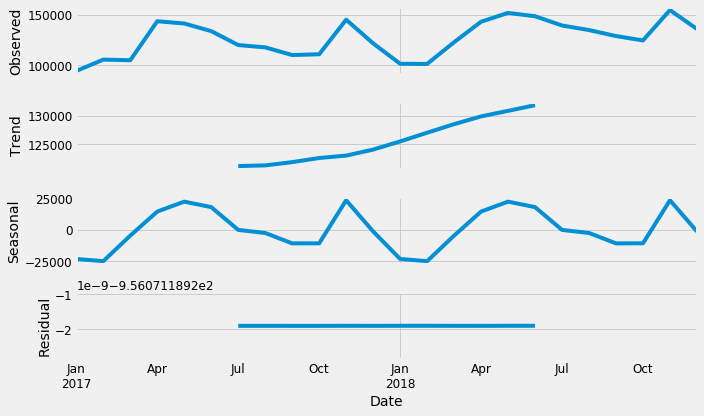

In [217]:
from pylab import rcParams
rcParams['figure.figsize'] = 10,6
decomposition = sm.tsa.seasonal_decompose(act_data, model='additive')
fig = decomposition.plot()
plt.show()


## Time series forecasting with ARIMA

In [218]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))




for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(y,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue
            

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)
ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:608.6452182113122
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:243.6895493727228
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:252.6095063438239
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:569.1995352984713
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:217.5327920905436
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:332.92629750515664
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:493.2783945252316
ARIMA(0, 1, 0)x(0, 1, 0, 12)12 - AIC:215.5329619032375
ARIMA(0, 1, 0)x(1, 0, 0, 12)12 - AIC:234.193949298821
ARIMA(0, 1, 1)x(0, 0, 0, 12)12 - AIC:474.1867758116551
ARIMA(0, 1, 1)x(0, 1, 0, 12)12 - AIC:193.70386648035836
ARIMA(0, 1, 1)x(1, 0, 0, 12)12 - AIC:242.21880061453965
ARIMA(1, 0, 0)x(0, 0, 0, 12)12 - AIC:516.9679113472549
ARIMA(1, 0, 0)x(0, 1, 0, 12)12 - AIC:237.61879073534885
ARIMA(1, 0, 0)x(1, 0, 0, 12)12

## Fitting the ARIMA model

In [219]:
mod = sm.tsa.statespace.SARIMAX(y,
                                order=(1, 1, 1),
                                seasonal_order=(1, 0, 0, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results = mod.fit()
print('\033[1m')
print(results.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1139      0.391      0.291      0.771      -0.653       0.881
ma.L1         -0.6933      0.161     -4.310      0.000      -1.009      -0.378
ar.S.L12       0.6528      0.120      5.425      0.000       0.417       0.889
sigma2      1.671e+07   3.26e-09   5.13e+15      0.000    1.67e+07    1.67e+07


In [221]:
# results.plot_diagnostics(figsize=(16, 8))
# plt.show()

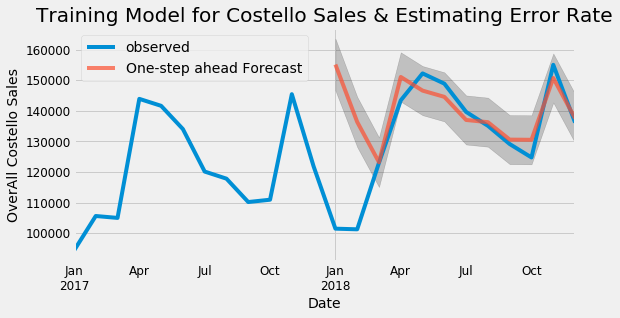

In [248]:
pred = results.get_prediction(start=pd.to_datetime('2018-01-01'), dynamic=False)
pred_ci = pred.conf_int()
ax = y['2017':].plot(label='observed', figsize=(10,3))
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=0.7, figsize=(8, 4))
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('OverAll Costello Sales')
plt.title('Training Model for Costello Sales & Estimating Error Rate')
plt.legend()
plt.show()

In [249]:
y_forecasted = pred.predicted_mean
y_truth = y['2018-01-01':]
mse = ((y_forecasted - y_truth) ** 2).mean()
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))


print('The Root Mean Squared Error of our forecasts is {}'.format(round(np.sqrt(mse), 2)))



The Mean Squared Error of our forecasts is 357223620.08
The Root Mean Squared Error of our forecasts is 18900.36


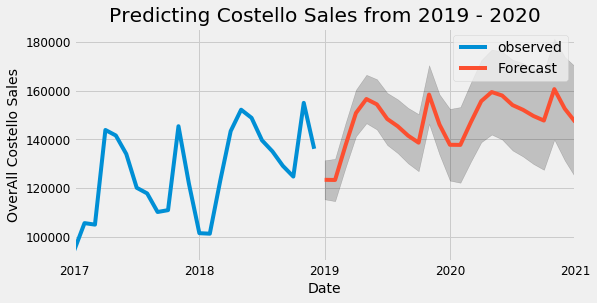

In [255]:
pred_uc = results.get_forecast(steps=25)
pred_ci = pred_uc.conf_int()
ax = y.plot(label='observed', figsize=(12, 5))
pred_uc.predicted_mean.plot(ax=ax, label='Forecast',figsize=(8, 4))
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('OverAll Costello Sales')
plt.title('Predicting Costello Sales from 2019 - 2020')
plt.legend()
plt.show()

## Time Series of Sales for Stores based on their Age

In [ ]:
df_fcst['Receipt Number'] = df_fcst['Receipt Number'].astype('str') 
# df_fcst['Store_Age'] = df_fcst['Store #'].str.strip().str[-1]
df_fcst['Store_Age'] = df_fcst['Store #']
df_fcst['Store_Age'].isna().sum()

In [24]:
st_age= df_fcst.groupby(['Store_Age','Yr_Mth'])[('Net Sales')].sum().reset_index()

In [27]:
titl={
        'text': "Monthly Sales Trend as Per Store Age",
        'y':0.88,
        'x':0.63,
        'xanchor': 'right',
        'yanchor': 'top'}
fig = px.line(st_age, x="Yr_Mth", y="Net Sales",color="Store_Age", title = titl)
fig.show()

In [106]:
bins = [1, 3, 6, 10]
group_names = ['New', 'Old', 'VeryOld']
df_fcst['Store_AgeGroup'] = pd.cut(df_fcst['Store_Age'], bins, labels=group_names)


In [111]:
df_fcst['Store_AgeGroup'].value_counts()

VeryOld    1229070
Old        1083082
New         460659
Name: Store_AgeGroup, dtype: int64

In [205]:
store1 = df_fcst.loc[df_fcst['Store_AgeGroup'] == 'VeryOld']
store2 = df_fcst.loc[df_fcst['Store_AgeGroup'] == 'Old']
store3 = df_fcst.loc[df_fcst['Store_AgeGroup'] == 'New']

store1 = store1.sort_values('Date')
store2 = store2.sort_values('Date')
store3 = store3.sort_values('Date')

store1 = store1.groupby('Date')['Net Sales'].sum().reset_index()
store2 = store2.groupby('Date')['Net Sales'].sum().reset_index()
store3 = store3.groupby('Date')['Net Sales'].sum().reset_index()

store1 = store1.set_index('Date')
store2 = store2.set_index('Date')
store3 = store3.set_index('Date')

y_store1 = store1['Net Sales'].resample('MS').mean()
y_store2 = store2['Net Sales'].resample('MS').mean()
y_store3 = store3['Net Sales'].resample('MS').mean()


store1 = pd.DataFrame({'Date':y_store1.index, 'Net Sales':y_store1.values})
store2 = pd.DataFrame({'Date': y_store2.index, 'Net Sales': y_store2.values})
store3 = pd.DataFrame({'Date': y_store3.index, 'Net Sales': y_store3.values})

store = store1.merge(store2, how='inner', on='Date')
store.rename(columns={'Net Sales_x': 'VeryOldstore_Net Sales', 'Net Sales_y': 'Oldstore_Net Sales'}, inplace=True)

store = store.merge(store3, how='inner', on='Date')
store.rename(columns={'Net Sales_x': 'VeryOldStore_Net Sales', 'Net Sales_y': 'OldStore_Net Sales','Net Sales': 'NewStore_Net Sales'}, inplace=True)

store.head()



,Date,VeryOldstore_Net Sales,Oldstore_Net Sales,NewStore_Net Sales
0,2017-01-01,14436.605484,13327.130645,5758.608710
1,2017-02-01,16492.268571,15039.285357,6369.356786
2,2017-03-01,16656.467742,14942.756129,6732.072258
3,2017-04-01,23002.061667,19580.265333,8530.575333
4,2017-05-01,21979.679677,19808.123548,8158.310000


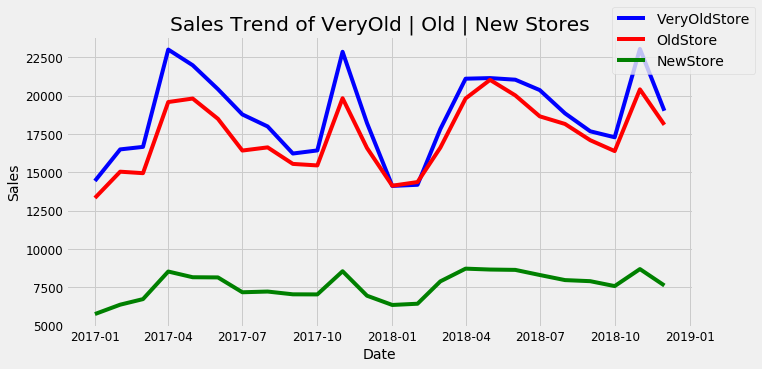

In [215]:
plt.figure(figsize=(10, 5))
plt.plot(store['Date'], store['VeryOldstore_Net Sales'], 'b-', label = 'VeryOldStore')
plt.plot(store['Date'], store['Oldstore_Net Sales'], 'r-', label = 'OldStore')
plt.plot(store['Date'], store['NewStore_Net Sales'], 'g-', label = 'NewStore')

plt.xlabel('Date'); plt.ylabel('Sales'); plt.title('Sales Trend of VeryOld | Old | New Stores')
plt.legend(bbox_to_anchor=(1.1,1.1),borderaxespad=0.0,loc="upper right")

In [167]:
y= y_store3

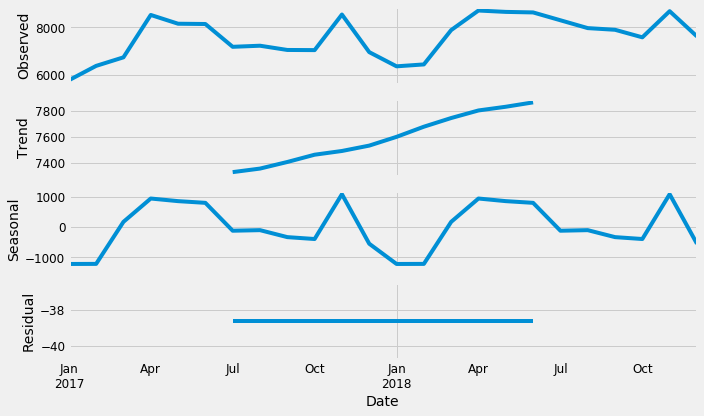

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)
ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:479.05893713760116
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:176.92134519352328
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:179.77367868919876
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:445.3573372665184
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:161.1328812104473
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:180.36590147385542
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:360.22957795307207
ARIMA(0, 1, 0)x(0, 1, 0, 12)12 - AIC:157.53567332560212
ARIMA(0, 1, 0)x(1, 0, 0, 12)12 - AIC:168.72934958052866
ARIMA(0, 1, 1)x(0, 0, 0, 12)12 - AIC:346.3702072784501
ARIMA(0, 1, 1)x(0, 1, 0, 12)12 - AIC:134.05042571356068
ARIMA(0, 1, 1)x(1, 0, 0, 12)12 - AIC:166.8057584411686
ARIMA(1, 0, 0)x(0, 0, 0, 12)12 - AIC:378.0241439683265
ARIMA(1, 0, 0)x(0, 1, 0, 12)12 - AIC:172.90798862463382
ARIMA(1, 0, 0)x(1, 0, 0,

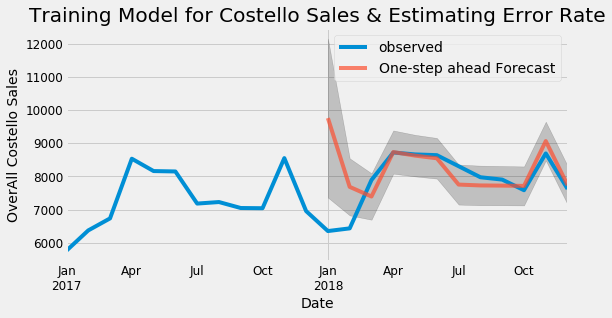

The Mean Squared Error of our forecasts is 1164926.38
The Root Mean Squared Error of our forecasts is 1079.32


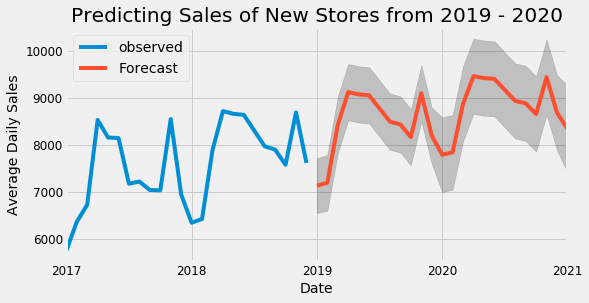

In [169]:
from pylab import rcParams
rcParams['figure.figsize'] = 10,6
decomposition = sm.tsa.seasonal_decompose(y, model='additive')
fig = decomposition.plot()
plt.show()


p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))




for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(y,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue
            
            
mod = sm.tsa.statespace.SARIMAX(y,
                                order=(1, 1, 1),
                                seasonal_order=(1, 0, 0, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results = mod.fit()
print(results.summary().tables[1])



pred = results.get_prediction(start=pd.to_datetime('2018-01-01'), dynamic=False)
pred_ci = pred.conf_int()
ax = y['2017':].plot(label='observed', figsize=(10,3))
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=0.7, figsize=(8, 4))
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('OverAll Costello Sales')
plt.title('Training Model for Costello Sales & Estimating Error Rate')
plt.legend()
plt.show()


y_forecasted = pred.predicted_mean
y_truth = y['2018-01-01':]
mse = ((y_forecasted - y_truth) ** 2).mean()
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))


print('The Root Mean Squared Error of our forecasts is {}'.format(round(np.sqrt(mse), 2)))



pred_uc = results.get_forecast(steps=25)
pred_ci = pred_uc.conf_int()
ax = y.plot(label='observed', figsize=(12, 5))
pred_uc.predicted_mean.plot(ax=ax, label='Forecast',figsize=(8, 4))
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Average Daily Sales')
plt.title('Predicting Sales of New Stores from 2019 - 2020')
plt.legend()
plt.show()



            

In [172]:
df_fcst['cust_seg'].unique()

array(['other', 'BestCustomers', 'BigSpenders', 'LostCheapCustomers',
       'LostBigSpenders', 'LostBestCustomers', 'Loyal Customers'],
      dtype=object)

In [173]:
cust1 = df_fcst.loc[df_fcst['cust_seg'] == 'BestCustomers']
cust2 = df_fcst.loc[df_fcst['cust_seg'] == 'LostBestCustomers']
cust3 = df_fcst.loc[df_fcst['cust_seg'] == 'BigSpenders']
cust4 = df_fcst.loc[df_fcst['cust_seg'] == 'Loyal Customers']


cust1 = cust1.sort_values('Date')
cust2 = cust2.sort_values('Date')
cust3 = cust3.sort_values('Date')
cust4 = cust4.sort_values('Date')



cust1 = cust1.groupby('Date')['Net Sales'].sum().reset_index()
cust2 = cust2.groupby('Date')['Net Sales'].sum().reset_index()
cust3 = cust3.groupby('Date')['Net Sales'].sum().reset_index()
cust4 = cust4.groupby('Date')['Net Sales'].sum().reset_index()



cust1 = cust1.set_index('Date')
cust2 = cust2.set_index('Date')
cust3 = cust3.set_index('Date')
cust4 = cust4.set_index('Date')


y_cust1 = cust1['Net Sales'].resample('MS').mean()
y_cust2 = cust2['Net Sales'].resample('MS').mean()
y_cust3 = cust3['Net Sales'].resample('MS').mean()
y_cust4 = cust4['Net Sales'].resample('MS').mean()



In [191]:
y= y_cust4

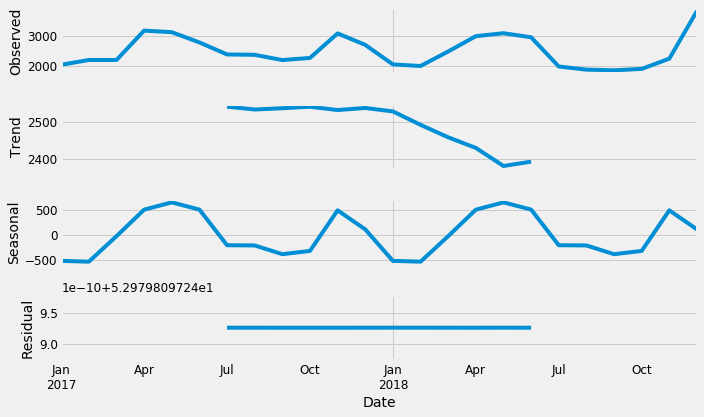

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)
ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:428.26766252408487
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:169.74560488913693
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:185.3702954978763
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:387.51784916868854
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:157.12315402800937
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:186.68784308960383
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:341.0370688774655
ARIMA(0, 1, 0)x(0, 1, 0, 12)12 - AIC:161.13835650568473
ARIMA(0, 1, 0)x(1, 0, 0, 12)12 - AIC:175.45068400174722
ARIMA(0, 1, 1)x(0, 0, 0, 12)12 - AIC:326.8048600873921
ARIMA(0, 1, 1)x(0, 1, 0, 12)12 - AIC:144.45859862724205
ARIMA(0, 1, 1)x(1, 0, 0, 12)12 - AIC:176.19369697630532
ARIMA(1, 0, 0)x(0, 0, 0, 12)12 - AIC:357.4170225024417
ARIMA(1, 0, 0)x(0, 1, 0, 12)12 - AIC:171.46803574111948
ARIMA(1, 0, 0)x(1, 0, 0

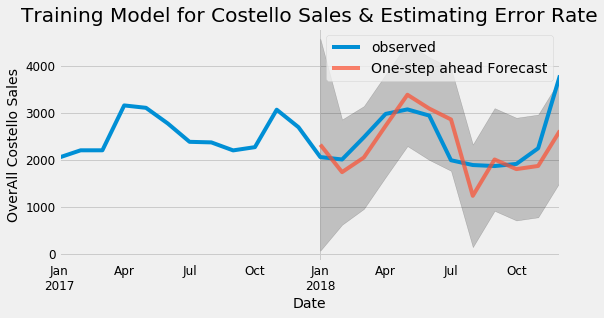

The Mean Squared Error of our forecasts is 271958.09
The Root Mean Squared Error of our forecasts is 521.5


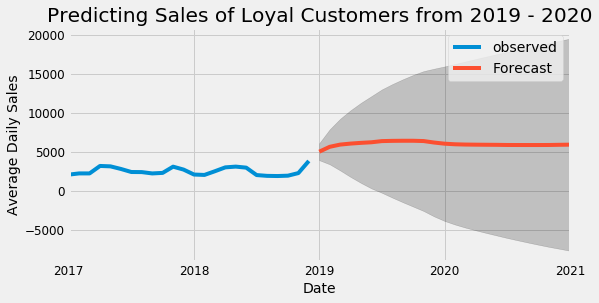

In [192]:
from pylab import rcParams
rcParams['figure.figsize'] = 10,6
decomposition = sm.tsa.seasonal_decompose(y, model='additive')
fig = decomposition.plot()
plt.show()


p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))




for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(y,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue
            
            
mod = sm.tsa.statespace.SARIMAX(y,
                                order=(1, 1, 1),
                                seasonal_order=(1, 0, 0, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results = mod.fit()
print(results.summary().tables[1])



pred = results.get_prediction(start=pd.to_datetime('2018-01-01'), dynamic=False)
pred_ci = pred.conf_int()
ax = y['2017':].plot(label='observed', figsize=(10,3))
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=0.7, figsize=(8, 4))
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('OverAll Costello Sales')
plt.title('Training Model for Costello Sales & Estimating Error Rate')
plt.legend()
plt.show()


y_forecasted = pred.predicted_mean
y_truth = y['2018-01-01':]
mse = ((y_forecasted - y_truth) ** 2).mean()
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))


print('The Root Mean Squared Error of our forecasts is {}'.format(round(np.sqrt(mse), 2)))

pred_uc = results.get_forecast(steps=25)
pred_ci = pred_uc.conf_int()
ax = y.plot(label='observed', figsize=(12, 5))
pred_uc.predicted_mean.plot(ax=ax, label='Forecast',figsize=(8, 4))
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Average Daily Sales')
plt.title('Predicting Sales of Loyal Customers from 2019 - 2020')
plt.legend()
plt.show()

            

In [199]:
large_stores= df_fcst.groupby(['Department Name'])[('Net Sales')].sum().reset_index()
large_stores=large_stores.nlargest(5, 'Net Sales')
large_stores


,Department Name,Net Sales
33,PAINT & PAINT SUPPLIES,1.565972e+07
25,"LAWN, GARDEN & FARM SUPPLIES",1.479301e+07
18,HARDWARE,6.585710e+06
13,"FLASHLIGHTS, LIGHTING & SUPPLIES",6.261077e+06
32,OUTDOOR LIVING & FURNITURE,5.916536e+06


In [200]:
prod1 = df_fcst.loc[df_fcst['Department Name'] == 'PAINT & PAINT SUPPLIES']

prod1 = prod1.sort_values('Date')

prod1 = prod1.groupby('Date')['Net Sales'].sum().reset_index()

prod1 = prod1.set_index('Date')

y_prod1 = prod1['Net Sales'].resample('MS').mean()


In [201]:
y=y_prod1

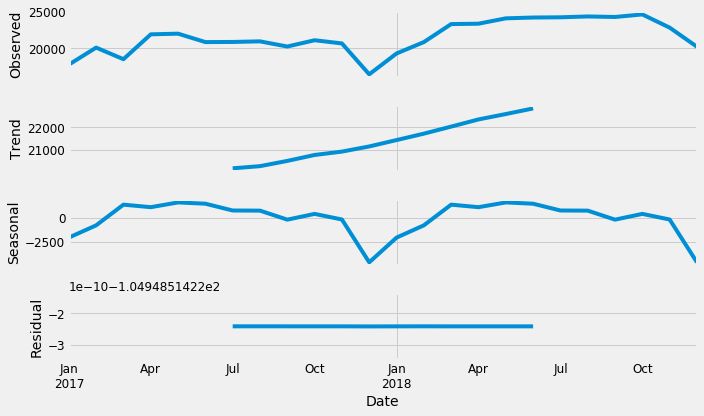

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)
ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:526.8586926301653
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:210.8310826344734
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:209.27511990674748
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:490.74736294748965
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:183.40742068137666
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:280.7499908595308
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:391.3798050224059
ARIMA(0, 1, 0)x(0, 1, 0, 12)12 - AIC:181.05790210884896
ARIMA(0, 1, 0)x(1, 0, 0, 12)12 - AIC:191.1613029066316
ARIMA(0, 1, 1)x(0, 0, 0, 12)12 - AIC:375.68929262375815
ARIMA(0, 1, 1)x(0, 1, 0, 12)12 - AIC:154.50388261521107
ARIMA(0, 1, 1)x(1, 0, 0, 12)12 - AIC:192.37872961851653
ARIMA(1, 0, 0)x(0, 0, 0, 12)12 - AIC:411.97509515271486
ARIMA(1, 0, 0)x(0, 1, 0, 12)12 - AIC:199.66501454692536
ARIMA(1, 0, 0)x(1, 0, 0,

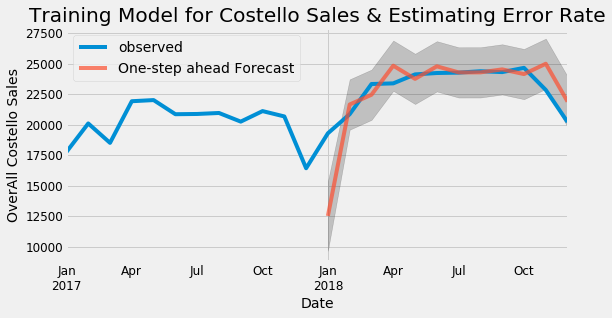

The Mean Squared Error of our forecasts is 4793341.06
The Root Mean Squared Error of our forecasts is 2189.37


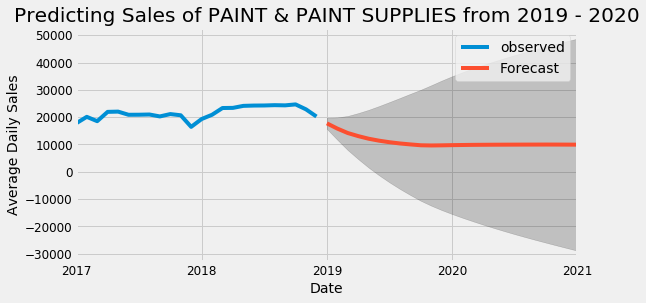

In [203]:
from pylab import rcParams
rcParams['figure.figsize'] = 10,6
decomposition = sm.tsa.seasonal_decompose(y, model='additive')
fig = decomposition.plot()
plt.show()


p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))




for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(y,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue
            
            
mod = sm.tsa.statespace.SARIMAX(y,
                                order=(1, 1, 1),
                                seasonal_order=(1, 0, 0, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results = mod.fit()
print(results.summary().tables[1])



pred = results.get_prediction(start=pd.to_datetime('2018-01-01'), dynamic=False)
pred_ci = pred.conf_int()
ax = y['2017':].plot(label='observed', figsize=(10,3))
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=0.7, figsize=(8, 4))
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('OverAll Costello Sales')
plt.title('Training Model for Costello Sales & Estimating Error Rate')
plt.legend()
plt.show()


y_forecasted = pred.predicted_mean
y_truth = y['2018-01-01':]
mse = ((y_forecasted - y_truth) ** 2).mean()
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))


print('The Root Mean Squared Error of our forecasts is {}'.format(round(np.sqrt(mse), 2)))

pred_uc = results.get_forecast(steps=25)
pred_ci = pred_uc.conf_int()
ax = y.plot(label='observed', figsize=(12, 5))
pred_uc.predicted_mean.plot(ax=ax, label='Forecast',figsize=(8, 4))
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Average Daily Sales')
plt.title('Predicting Sales of PAINT & PAINT SUPPLIES from 2019 - 2020')
plt.legend()
plt.show()

            

In [216]:
df_fcst['month'] = df_fcst['Date'].dt.month

In [223]:
bins = [1,3,6,9,11,12]
group_names = ['Winter', 'Spring', 'Summer','Fall','Wint']


In [224]:
df_fcst['Season'] = pd.cut(df_fcst['month'], bins, labels=group_names)

In [235]:
df_fcst['Season']= np.where(df_fcst['month'].isin(['1','2','12']), 'Winter',
                                np.where(df_fcst['month'].isin(['3','4','5']),'Spring',
                                         np.where(df_fcst['month'].isin(['6','7','8']),'Summer',
                                                np.where( df_fcst['month'].isin(['9','10','11']),'Fall','other'
                                                                  ))))

In [237]:
df_fcst['Season'].unique()

array(['Winter', 'Spring', 'Summer', 'Fall'], dtype=object)

['Fall' 'Spring' 'Summer' 'Winter']
  Season               Class Name  Net Sales
0   Fall        12 VOLT BATTERIES    4131.63
1   Fall  A/C & RANGEHOOD FILTERS    1619.17
2   Fall  ABOVE GROUND IRRIGATION   40280.80
3   Fall              ACE APPAREL      21.62
4   Fall  ACE COUPON/CREDIT ITEMS    8409.04


Text(0.5, 0, 'Season Wise Most Bought Products')

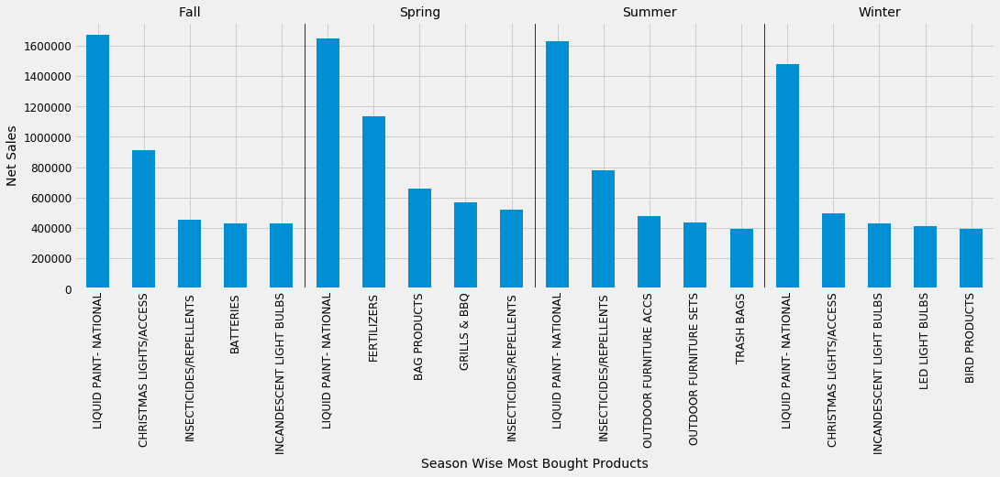

In [238]:
var1= 'Season'
var2= 'Class Name'
grp_st_prod_trxns= df_fcst.groupby([var1,var2])[('Net Sales')].sum().reset_index()

large_stores= df_fcst.groupby([var1])[('Net Sales')].sum().reset_index()
# large_stores=large_stores.nlargest(5, 'Net Sales')
large_stores= large_stores[var1]

large_stores= pd.merge(grp_st_prod_trxns, large_stores,on=var1)

print(large_stores[var1].unique())
print(large_stores.head())


group = large_stores.groupby([var1,var2]).sum()
total_sales = group["Net Sales"].groupby(level=0, group_keys=False)
gtp = total_sales.nlargest(5)


ax = gtp.plot(kind="bar",figsize= (16,5))


#draw lines and titles
count = gtp.groupby(var1).count()
cs = np.cumsum(count)
for i in range(len(count)):
    title = count.index.values[i]
    ax.axvline(cs[i]-.5, lw=0.8, color="k")
    ax.text(cs[i]-(count[i]+1)/2., 1.02, title, ha="center",
            transform=ax.get_xaxis_transform())

# shorten xticklabels
ax.set_xticklabels([l.get_text().split(", ")[1][:-1] for l in ax.get_xticklabels()])
# ax.set_title('scas',loc='center', fontdict= {'verticalalignment': 'top'},pad=None)
ax.set_ylabel('Net Sales')
ax.set_xlabel('Season Wise Most Bought Products')


In [ ]:
df_fcst.to_csv('./data_processed_segments.csv', index=False)

In [3]:
df_fcst= pd.read_csv("./data_processed_segments.csv")

### Cashier Pschycology

Filter receipts having more than 10 items on the best store Clerk | Receipt Number | Item Description | Line #

In [39]:
store_cash = df_fcst.loc[df_fcst['Store Name'] == '14252 ISLAND PARK']

clk= store_cash.groupby(['Clerk'])[('Receipt Number')].nunique().reset_index()
lrg_clk=clk.nlargest(5, 'Receipt Number')
lrg_clk


,Clerk,Receipt Number
23,GINA PEARSALL,38352
5,BARBARA NEGRON,34128
32,JESSICA GRAEPEL,27578
8,BRIANNA MATTHEWS,26693
4,ANTOINETTE ARAGONA,25061


In [40]:
store_cash = store_cash.loc[store_cash['Clerk'] == 'GINA PEARSALL']
store_cash = store_cash[['Clerk', 'Receipt Number','Item Description','Line #']]
min_purchase= store_cash.groupby(['Receipt Number'])[('Line #')].nunique().reset_index()
min_purchase['Line #'].describe()

count    38352.000000
mean         2.653708
std          2.214819
min          1.000000
25%          1.000000
50%          2.000000
75%          3.000000
max         40.000000
Name: Line #, dtype: float64

Filtering Receipts Containing More than 2 Items

In [41]:
thres= 2
min_purchase = min_purchase[min_purchase['Line #'] >=thres]
min_purchase.columns = ['Receipt Number','Total_Items_Invoice']
store_cash= pd.merge(store_cash, min_purchase,on='Receipt Number')

clk_agg= store_cash.groupby(['Item Description','Line #'])[('Receipt Number')].nunique().reset_index()

clk_norm= store_cash.groupby(['Item Description'])[('Receipt Number')].nunique().reset_index()
clk_agg.columns = ['Item Description','Rank','Count_Rank']
clk_norm.columns = ['Item Description','Total_Sales']


Picking Top 20 Ranked Items of invoices for Visualisation

In [42]:
#Filtering Top 20 Items Sold
top_items =10
clk_norm=clk_norm.nlargest(top_items, 'Total_Sales')

clk_agg= pd.merge(clk_agg, clk_norm,on='Item Description')

clk_agg['per_rank'] = round(clk_agg.Count_Rank*100/clk_agg.Total_Sales)
clk_agg['Rank'] = clk_agg['Rank'].astype(int)
clk_agg 

# get top 10 most frequent names
clk_agg.head()

,Item Description,Rank,Count_Rank,Total_Sales,per_rank
0,$5 Costello's Cash,2,38,145,26.0
1,$5 Costello's Cash,3,46,145,32.0
2,$5 Costello's Cash,4,21,145,14.0
3,$5 Costello's Cash,5,12,145,8.0
4,$5 Costello's Cash,6,19,145,13.0


In [43]:
#Priting only top Ranks Secured
clk_agg['Item Description'].nunique()
rnk_thres= 5
clk_agg = clk_agg[clk_agg['Rank'] <=rnk_thres]
clk_agg.head()

,Item Description,Rank,Count_Rank,Total_Sales,per_rank
0,$5 Costello's Cash,2,38,145,26.0
1,$5 Costello's Cash,3,46,145,32.0
2,$5 Costello's Cash,4,21,145,14.0
3,$5 Costello's Cash,5,12,145,8.0
12,BIRDSEED WILDBIRD 20#ACE,1,192,282,68.0


In [44]:
clk_agg.shape

(48, 5)

In [46]:
clk_agg.to_csv('./clerk_rankedscanning.csv', index=False)

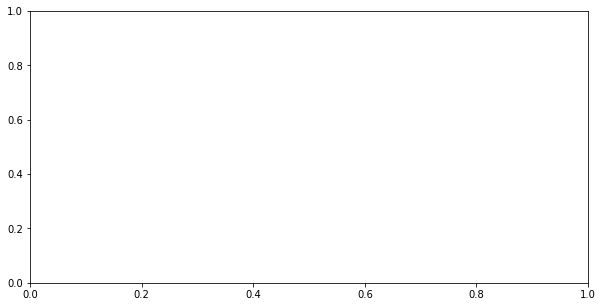

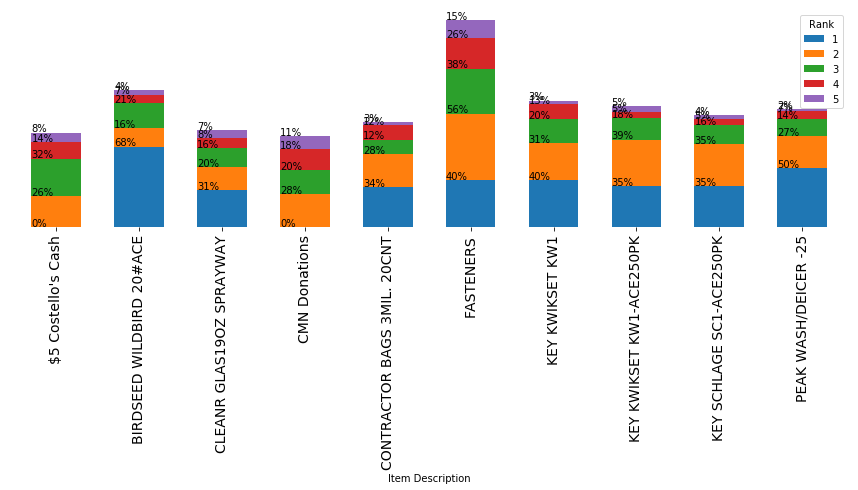

In [50]:
f, ax = plt.subplots(1, figsize=(10,5))
clk_agg['per_rank']=clk_agg['per_rank']/100
s = clk_agg.pivot_table(index='Item Description', columns='Rank', values='per_rank', aggfunc='mean')

bar_width= 0.6
ax= s.plot(kind='bar', stacked=True,figsize=(15,4), edgecolor=None,width=bar_width)

plt.xticks(fontsize=14)
for spine in plt.gca().spines.values():
    spine.set_visible(False)
plt.yticks([])

# Add this loop to add the annotations
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.annotate('{:.0%}'.format(height), (x, y + height + 0.01))



plt.show()    
    

Comparisions between Clerks of a Store

In [173]:
store_cash = df_fcst.loc[df_fcst['Store Name'] == '14252 ISLAND PARK']

clk= store_cash.groupby(['Clerk'])[('Receipt Number')].nunique().reset_index()
lrg_clk=clk.nlargest(5, 'Receipt Number')
lrg_clk['Clerk']

23         GINA PEARSALL
5         BARBARA NEGRON
32       JESSICA GRAEPEL
8       BRIANNA MATTHEWS
4     ANTOINETTE ARAGONA
Name: Clerk, dtype: object

In [174]:
clk_list=list(lrg_clk['Clerk'])

In [175]:
store_cash = store_cash.loc[store_cash['Clerk'] .isin(clk_list)]
store_cash = store_cash[['Clerk', 'Receipt Number','Item Description','Line #']]
min_purchase= store_cash.groupby(['Receipt Number'])[('Line #')].nunique().reset_index()
min_purchase['Line #'].describe()


count    151812.000000
mean          2.752674
std           2.282126
min           1.000000
25%           1.000000
50%           2.000000
75%           3.000000
max          56.000000
Name: Line #, dtype: float64

In [176]:
thres= 2
min_purchase = min_purchase[min_purchase['Line #'] >=thres]
min_purchase.columns = ['Receipt Number','Total_Items_Invoice']
store_cash= pd.merge(store_cash, min_purchase,on='Receipt Number')

In [177]:
store_cash.head()

,Clerk,Receipt Number,Item Description,Line #,Total_Items_Invoice
0,BARBARA NEGRON,B46100,5SHELF UNIT 34X14X72,1.0,4
1,BARBARA NEGRON,B46100,"DRI WALL PRO 1""W/MAGNET",2.0,4
2,BARBARA NEGRON,B46100,SAW WALBRD DBLEDGD ACE,3.0,4
3,BARBARA NEGRON,B46100,TOTE 18GL CHARCOAL,4.0,4
4,JESSICA GRAEPEL,B46456,MINI PRO SONICPESTCHASER,1.0,4


In [178]:
clk_agg= store_cash.groupby(['Clerk','Item Description','Line #'])[('Receipt Number')].nunique().reset_index()
clk_norm= store_cash.groupby(['Clerk','Item Description'])[('Receipt Number')].nunique().reset_index()

clk_agg.columns = ['Clerk','Item Description','Rank','Count_Rank']
clk_norm.columns = ['Clerk','Item Description','Total_Sales']

In [179]:
#Filtering Top 10 Items Sold
# top_items =10
# clk_norm=clk_norm.nlargest(top_items, 'Total_Sales')

clk_agg= pd.merge(clk_agg, clk_norm,on=('Clerk','Item Description'))

clk_agg['per_rank'] = round(clk_agg.Count_Rank*100/clk_agg.Total_Sales)
clk_agg['Rank'] = clk_agg['Rank'].astype(int)


In [180]:
print(max(clk_agg['per_rank']))
clk_agg.head()

100.0


,Clerk,Item Description,Rank,Count_Rank,Total_Sales,per_rank
0,ANTOINETTE ARAGONA,"""19.5""""B/O LIGHTED MAGNESIUM HO""",1,2,3,67.0
1,ANTOINETTE ARAGONA,"""19.5""""B/O LIGHTED MAGNESIUM HO""",4,1,3,33.0
2,ANTOINETTE ARAGONA,"""HAT"" VOGUE MD",2,1,1,100.0
3,ANTOINETTE ARAGONA,"""HAT""OUTBACK LG",1,1,1,100.0
4,ANTOINETTE ARAGONA,"""HAT""SG GAMBLER LB",2,1,1,100.0


In [181]:
#Filtering Total Number of Sales of any particular item for better confidence
sales_thres=10
clk_agg = clk_agg[clk_agg['Total_Sales'] >sales_thres]


In [182]:
#Priting only top Ranks Secured
clk_agg['Item Description'].nunique()
rnk_thres= 5
clk_agg = clk_agg[clk_agg['Rank'] <=rnk_thres]
clk_agg.head()

,Clerk,Item Description,Rank,Count_Rank,Total_Sales,per_rank
32,ANTOINETTE ARAGONA,$7 OFF $20,2,2,16,12.0
33,ANTOINETTE ARAGONA,$7 OFF $20,3,3,16,19.0
34,ANTOINETTE ARAGONA,$7 OFF $20,4,3,16,19.0
46,ANTOINETTE ARAGONA,$7 OFF $25 REG PRICE ITEMS,1,1,25,4.0
47,ANTOINETTE ARAGONA,$7 OFF $25 REG PRICE ITEMS,2,6,25,24.0


In [183]:
clk_topranks= clk_agg.groupby(['Clerk','Rank'])['per_rank'].nlargest(1,keep='first').reset_index()
clk_topranks= clk_topranks.drop(['level_2'], axis=1)

In [184]:
clk_topranks.head()

,Clerk,Rank,per_rank
0,ANTOINETTE ARAGONA,1,88.0
1,ANTOINETTE ARAGONA,2,83.0
2,ANTOINETTE ARAGONA,3,55.0
3,ANTOINETTE ARAGONA,4,45.0
4,ANTOINETTE ARAGONA,5,38.0


In [185]:
clk_agg= pd.merge(clk_agg,clk_topranks,on=('Clerk','Rank','per_rank'))


In [363]:
clk_agg.head()

,Clerk,Item Description,Rank,Count_Rank,Total_Sales,per_rank
0,ANTOINETTE ARAGONA,"6"" X 11"" SOLVENT REST TRAY",3,6,11,55.0
1,ANTOINETTE ARAGONA,APRIL M1 $5 OFF $25,5,5,13,38.0
2,ANTOINETTE ARAGONA,APRIL/MAYOFFER1$5OFF$20,5,5,13,38.0
3,ANTOINETTE ARAGONA,SANDPAPR ALOX9X11 MED5PK,4,5,11,45.0
4,ANTOINETTE ARAGONA,SCREEN REPAIR,1,37,42,88.0


In [218]:
clk_list[4]

'ANTOINETTE ARAGONA'

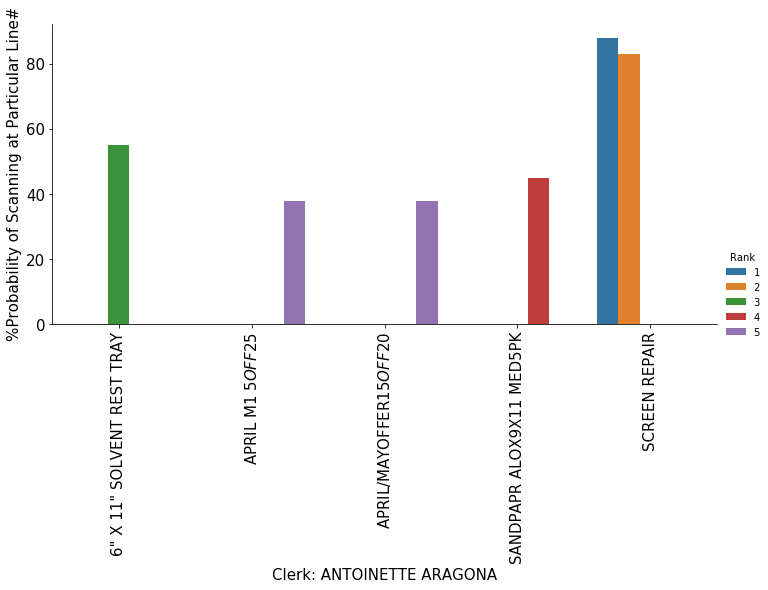

In [362]:
cl= clk_list[4]
tmp = clk_agg.loc[clk_agg['Clerk'] == cl]

g = sns.catplot(x="Item Description", y="per_rank",hue="Rank",data=tmp, kind="bar", height= 5,aspect=2)
size=15
g.set_xticklabels(rotation =90, fontsize= size)
g.set_yticklabels(rotation =0, fontsize= size)
title = "Clerk: " + str(cl)
g.set_xlabels(title,fontsize= size)
g.set_ylabels('%Probability of Scanning at Particular Line#',fontsize= size)

g.set_titles(title)


Text(0, 0.5, '%Times a Product was Scanned at Particular Line#')

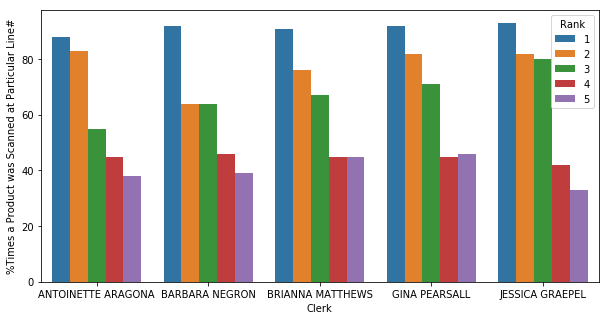

In [213]:
f, ax = plt.subplots(1, figsize=(10,5))
ax=sns.barplot(x="Clerk", hue="Rank", y="per_rank", data=clk_agg)
ax.set_ylabel('%Times a Product was Scanned at Particular Line#')

### HeatMap for geo Locations of Supply and Demand

In [4]:
df_fcst= pd.read_csv("./data_processed_segments.csv")

In [5]:
# Import the necessary libraries

from folium import plugins
from folium.plugins import HeatMap

# For improved table display in the notebook
from IPython.display import display

In [6]:
zip_codes= pd.read_csv("uszips.csv")
zip_codes= zip_codes[['zip','lat','lng']]
zip_codes.columns = ['Zip Code','lat','lng']
zip_codes=zip_codes.drop_duplicates()


In [7]:
df_fcst= pd.merge(df_fcst, zip_codes,on='Zip Code', how='left' )

In [8]:
zip_dem= pd.read_csv("StoreZip_Dynamics.csv")
zip_dem= pd.merge(zip_dem, zip_codes,on='Zip Code', how='left' )

zip_dem.columns = ['Store Name', 'Store_Zip_Code', 'Population_Density', 'Housing_Units',
       'Family_Households', 'Home_Value', 'Household_Income', 'Store_lat', 'Store_lng']


In [9]:
df_fcst= pd.merge(df_fcst, zip_dem,on='Store Name', how='left' )

In [10]:
import folium
from folium import plugins
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

%matplotlib inline

In [11]:
m = folium.Map([40.60481, -73.64927], zoom_start=11)
m

## Plotting density for a specific Store

In [12]:
from folium import plugins
from folium.plugins import HeatMap
st_name= '16476 MELVILLE'

st_tmp = df_fcst.loc[df_fcst['Store Name'] == st_name]
st_lat= float(st_tmp.Store_lat.unique())
st_lng= float(st_tmp.Store_lng.unique())

st_tmp_smpl= st_tmp.sample(frac=0.1, replace=True)

# print(st_tmp_smpl.shape)

m = folium.Map([st_lat, st_lng], zoom_start=11)
folium.Marker([st_lat, st_lng],popup=st_name,icon=folium.Icon(color='green')).add_to(m)

# Ensure you're handing it floats
st_tmp_smpl['lat'] = st_tmp_smpl['lat'].astype(float)
st_tmp_smpl['lng'] = st_tmp_smpl['lng'].astype(float)
heat_df = st_tmp_smpl[['lat', 'lng']]

# List comprehension to make out list of lists
heat_data = [[row['lat'],row['lng']] for index, row in heat_df.iterrows()]

# Plot it on the map
HeatMap(heat_data).add_to(m)
# Display the map
m


(10931, 65)


In [13]:
from sklearn import preprocessing
store_sales= df_fcst.groupby(['Store Name'])[('Net Sales')].sum().reset_index()
x = store_sales[['Net Sales']].values.astype(float)

# Create a minimum and maximum processor object
min_max_scaler = preprocessing.MinMaxScaler()

# Create an object to transform the data to fit minmax processor
x_scaled = min_max_scaler.fit_transform(x)
store_sales['Net Sales']= x_scaled

In [14]:
zip_dem= pd.merge(zip_dem, store_sales,on='Store Name', how='left' )

In [15]:
zip_dem.head()

,Store Name,Store_Zip_Code,Population_Density,Housing_Units,Family_Households,Home_Value,Household_Income,Store_lat,Store_lng,Net Sales
0,14822 NORTHPORT,11768,"1,448","8,325","606,300","120,309","5,228",40.91062,-73.32621,0.295520
1,14664 NORTH MASSAPEQUA,11758,"4,892","18,795","446,600","104,986","11,901",40.66826,-73.45850,0.496192
2,11730 BETHPAGE,11714,"5,240","8,213","416,200","87,327","4,750",40.74254,-73.48606,0.354545
3,3164 NESCONSET,11767,"3,481","4,938","444,600","109,204","3,291",40.84388,-73.14474,0.338655
4,14252 ISLAND PARK,11558,"5,590","3,099","442,400","77,056","1,605",40.60481,-73.64927,1.000000


## Plotting Stores and Thier Demands on the Map

In [16]:
from folium import plugins
from folium.plugins import HeatMap


st_tmp = df_fcst.copy()
st_tmp= st_tmp.dropna(how='all')

st_tmp_smpl= st_tmp.sample(frac=0.004, replace=True)

print(st_tmp_smpl.shape)


m = folium.Map([st_lat, st_lng], zoom_start=11)

for index, row in zip_dem.iterrows():
    folium.Marker([row['Store_lat'], row['Store_lng']],
              popup=row['Store Name'],
#               icon=folium.Icon(color='green'),
              radius= row['Net Sales'],
              fill=True,
              fill_color='crimson'    
             ).add_to(m)

# Ensure you're handing it floats
st_tmp_smpl['lat'] = st_tmp_smpl['lat'].astype(float)
st_tmp_smpl['lng'] = st_tmp_smpl['lng'].astype(float)


heat_df = st_tmp_smpl[['lat', 'lng']]

# List comprehension to make out list of lists
heat_data = [[row['lat'],row['lng']] for index, row in heat_df.iterrows()]

# Plot it on the map
HeatMap(heat_data).add_to(m)

# Display the map
m


(32723, 65)


## Recommendation Engine

In [17]:
df_fcst.head()

,Date,Transaction Time,Customer Number,Receipt Number,Store #,Store Name,Scanned UPC,Item Number,Item Description,Net Sales Units,...,lat,lng,Store_Zip_Code,Population_Density,Housing_Units,Family_Households,Home_Value,Household_Income,Store_lat,Store_lng
0,2017-01-01,12:43:52,*57399,I75782,3.0,3164 NESCONSET,45923039171,NaN,40T8N/130V. MICROWAVE LAM,2.0,...,40.80676,-73.17087,11767.0,"3,481","4,938","444,600","109,204","3,291",40.84388,-73.14474
1,2017-01-01,11:50:04,389180,B46100,NaN,14252 ISLAND PARK,8.10565E+11,5396221.0,5SHELF UNIT 34X14X72,1.0,...,41.01680,-73.67728,11558.0,"5,590","3,099","442,400","77,056","1,605",40.60481,-73.64927
2,2017-01-01,14:33:07,21703,I04893,NaN,15110 GARDEN CITY PARK,32076002534,34921.0,WIRE CONN YL25PK SCREWON,1.0,...,40.74634,-73.63890,11040.0,"8,526","13,900","536,900","101,434","9,188",40.74562,-73.67983
3,2017-01-01,15:01:39,218364,I04924,NaN,15110 GARDEN CITY PARK,77089110036,11010.0,"PAINTBRSH 2"" POLY",1.0,...,40.74634,-73.63890,11040.0,"8,526","13,900","536,900","101,434","9,188",40.74562,-73.67983
4,2017-01-01,15:01:39,218364,I04924,NaN,15110 GARDEN CITY PARK,76174211153,2422335.0,"SURFACE FORM SHVR 7.25""",1.0,...,40.74634,-73.63890,11040.0,"8,526","13,900","536,900","101,434","9,188",40.74562,-73.67983


## Portfolio

In [18]:
df_fcst.columns

Index(['Date', 'Transaction Time', 'Customer Number', 'Receipt Number',
       'Store #', 'Store Name', 'Scanned UPC', 'Item Number',
       'Item Description', 'Net Sales Units', 'Net Sales', 'Cost',
       'Gross Margin', 'Gross Margin %', 'Department Code', 'Department Name',
       'Class Code', 'Class Name', 'Fineline Code', 'Fineline Name',
       'Item was Scanned', 'MIP Promo ID', 'Promo/Discount',
       'Dynamic Promo ID', 'Actual Price', 'Retail Price', 'Actual-Retail',
       'Taxable', 'Tender Type', '$ Off Retail', 'Zip Code', 'Zip Plus-4',
       'Loyalty ID', 'Clerk', 'Item Type', 'Line #',
       'Line Item Transaction Type', 'Pricing Source', 'Return Code', 'city',
       'state_name', 'Yr_Mth', 'InvoiceNo', 'frequency', 'recency',
       'monetary_value', 'r_quartile', 'f_quartile', 'm_quartile', 'RFMScore',
       'cust_seg', 'Store_Age', 'Store_AgeGroup', 'month', 'Season', 'lat',
       'lng', 'Store_Zip_Code', 'Population_Density', 'Housing_Units',
       'Family

In [19]:
df_fcst['Store Name'].nunique()

31

In [20]:
df_fcst['year'] = pd.DatetimeIndex(df_fcst['Date']).year

In [21]:
df_fcst['$ Off Retail'].head()

0      0
1     32
2    0.5
3      0
4      0
Name: $ Off Retail, dtype: object

In [22]:
large_stores= df_fcst.groupby(['year'])[('Store Name')].nunique().reset_index()
# large_stores=large_stores.nlargest(5, 'Receipt Number')
# large_stores.columns=  ['Store Name', 'Total Sales'] 

In [23]:
large_stores

,year,Store Name
0,2017,29
1,2018,31


In [24]:
# tmp= df_fcst.groupby(['year','Store_AgeGroup'])[('Store Name')].count().reset_index()
# tmp= df_fcst.groupby(['year'])[('Net Sales')].sum().reset_index()
tmp= df_fcst.groupby(['year'])[('Customer Number')].nunique().reset_index()
tmp

,year,Customer Number
0,2017,160655
1,2018,197381


In [25]:
tmp

,year,Customer Number
0,2017,160655
1,2018,197381


In [26]:
df_fcst['Store_AgeGroup'].value_counts()

VeryOld    1229070
Old        1083082
New         460659
Name: Store_AgeGroup, dtype: int64

In [ ]:
df_fcst['Cust_Tag']= np.where(df_fcst[df_fcst['Customer Number'].str.contains('*5', regex=False)], 'Senior_Discount',
                                np.where(df_fcst[df_fcst['Customer Number'].str.contains('', regex=False)],'Spring',
                                         np.where(df_fcst['month'].isin(['6','7','8']),'Summer',
                                                np.where( df_fcst['month'].isin(['9','10','11']),'Fall','other'
                                                                  ))))

In [85]:
tmp=df_fcst[df_fcst['Customer Number'].str.isalnum()]
tmp['Customer Number'].nunique()


161082

In [99]:
cont= ['10','100','1000','10000','100000'] 
tmp= df_fcst.loc[df_fcst['Customer Number'].isin(cont)]
tmp= tmp.groupby(['year'])[('Customer Number')].nunique().reset_index()
tmp



,year,Customer Number
0,2017,1
1,2018,1


In [27]:
df_fcst['$ Off Retail'] = df_fcst['$ Off Retail'].convert_objects(convert_numeric=True)

In [33]:
df_fcst['Actual-Retail'] = df_fcst['Actual-Retail'].convert_objects(convert_numeric=True)

In [26]:
df_fcst['Sp'] = df_fcst['Retail Price']- df_fcst['$ Off Retail']

In [30]:
df_fcst['Profit'] = df_fcst['Retail Price']- df_fcst['Actual Price']

In [ ]:
tmp= df_fcst.groupby(['year'])[('Actual-Retail')].sum().reset_index()
tmp

In [ ]:
'Actual Price', 'Retail Price', 'Actual-Retail', '$ Off Retail',

In [41]:
large_stores= df_fcst.groupby(['year',''])[('Retail Price')].sum().reset_index()
large_stores=large_stores.nsmallest(5, 'Net Sales')
large_stores

,year,Item Description,Net Sales
124,2017,$10 OFF $25 OR MORE REG PR PUR,0.0
125,2017,$10 OFF $40 OR MORE REG PR SUN,0.0
126,2017,$10 OFF $50 OR MORE,0.0
127,2017,$10 OFF $50 OR MORE REG PR PUR,0.0
128,2017,$10 OFF PURCH $50 OR MORE,0.0


In [61]:

df_fcst.iloc[df_fcst['Retail Price'].argmin()]


Date                                            2017-01-01
Transaction Time                                  15:01:39
Customer Number                                     218364
Receipt Number                                      I04924
Store #                                                NaN
Store Name                          15110 GARDEN CITY PARK
Scanned UPC                                       80040101
Item Number                                            NaN
Item Description                    SAVE 25% REGULAR ITEMS
Net Sales Units                                          1
Net Sales                                                0
Cost                                                     0
Gross Margin                                             0
Gross Margin %                                         NaN
Department Code                                         H2
Department Name                           IN STORE COUPONS
Class Code                                             N

In [58]:
tmp= df_fcst[df_fcst['Net Sales Units'] >1].head(1)

In [59]:
tmp =tmp[['Cost','Net Sales','Net Sales Units','Gross Margin']]

In [60]:
tmp

,Cost,Net Sales,Net Sales Units,Gross Margin
0,1.96,9.98,2.0,8.02


In [62]:
large_store = df_fcst.loc[df_fcst['Store Name'].isin(['14252 ISLAND PARK'])]

In [69]:
tmp= large_store.groupby(['Store Name'])[('Net Sales Units')].mean().reset_index()
tmp

,Store Name,Net Sales Units
0,14252 ISLAND PARK,1.575592
